<a href="https://colab.research.google.com/github/kecosz/FASTexELA/blob/main/amed_FAST_rELA0_74_2_sensitivity_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Sensitivity analysis for Suzuki et al. "Major microbiota transitions across liver disease progression are linked by key mediator taxa connecting host environments and microbial community structures"

## Preperation

In [ ]:
from IPython.display import Image, display

## rpy2 version specification
### Required to successfully execute "%load_ext rpy2.ipython" as of 2023/1
!pip install rpy2==3.5.1
#!pip install --upgrade ipykernel
%load_ext rpy2.ipython

###The following codes is just for not showing rpy2 messages related to R package installation on google colab
from rpy2.rinterface_lib.callbacks import logger as rpy2_logger
import logging
rpy2_logger.setLevel(logging.ERROR)   # will display errors, but not warnings

## Doanload rELA package
!git clone https://github.com/kecosz/FASTexELA.git


import os
os.environ["OPENBLAS_NUM_THREADS"] = "1"
os.environ["MKL_NUM_THREADS"] = "1"
os.environ["OMP_NUM_THREADS"] = "1"


#
out = "/content/ela_fast/results/"

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 201.7/201.7 kB 13.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for rpy2: filename=rpy2-3.5.1-cp312-cp312-linux_x86_64.whl size=316564 sha256=5525852251b2bd8802279e5ad86284adc396129dc2c9ceae1e351b8b9441a433
  Stored in directory: /root/.cache/pip/wheels/00/26/d5/d5e8c0b039915e785be870270e4a9263e5058168a03513d8cc
Successfully built rpy2
  Attempting uninstall: rpy2
    Found existing installation: rpy2 3.5.17
    Uninstalling rpy2-3.5.17:
      Successfully uninstalled rpy2-3.5.17
Cloning into 'FASTexELA'...
remote: Enumerating objects: 147, done.
remote: Counting objects: 100% (147/147), done.
remote: Compressing objects: 100% (141/141), done.
remote: Total 147 (delta 46), reused 39 (delta 3), pack-reused 0 (from 0)
Receiving objects: 100% (147/147), 40.93 MiB | 18.07 MiB/s, done.
Resolving deltas: 100% (46/46), done.


In [ ]:
%%R
## package instllation
install.packages("Rcpp")
install.packages("RcppArmadillo")
install.packages("doParallel")
install.packages('tidyverse')
install.packages('gsubfn')
install.packages('zoo')
install.packages('dplyr')
install.packages('tidyr')
install.packages('ggplot2')
install.packages('gtools')
install.packages('ggsci')
install.packages('igraph')
install.packages('tidygraph')
install.packages('RColorBrewer')
install.packages("stringdist")
install.packages("purrr")
install.packages("plot3D")
install.packages("devtools")
library("Rcpp")
library("RcppArmadillo")
library("doParallel")
library('tidyverse')
library('gsubfn')
library('zoo')
library('dplyr')
library('tidyr')
library('ggplot2')
library('gtools')
library('ggsci')
library('igraph')
library('tidygraph')
library('RColorBrewer')
library("stringdist")
library("purrr")
library("plot3D")
library("devtools")


#
install.packages("FASTexELA/rELA.v0.74.2_fast.tar.gz",type = "source")
#install_local("FASTexELA/rEL/rELA.v0.74.2.tar.gz",type="source")


#
source("FASTexELA/ela_fast_support_functions.R")
install_ela_visualization_dependencies()
load_ela_visualization_packages()


#
out <- "/content/ela_fast/results"


── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.2.1     ✔ readr     2.2.0
✔ forcats   1.0.1     ✔ stringr   1.6.0
✔ ggplot2   4.0.3     ✔ tibble    3.3.1
✔ lubridate 1.9.5     ✔ tidyr     1.3.2
✔ purrr     1.2.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ purrr::accumulate() masks foreach::accumulate()
✖ dplyr::filter()     masks stats::filter()
✖ dplyr::lag()        masks stats::lag()
✖ purrr::when()       masks foreach::when()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors


fitting ...
  |======================================================================| 100%
  gmm_cluster   n
1           1   4
2           2 121
3           3  46
Selected number of GMM clusters: 3 
Selected covariance model: EEE 
gmm_cluster
  1   2   3 
  4 121  46 
Largest GMM cluster: 2 
outlier_flag_gmm
  0   1 
121  50 


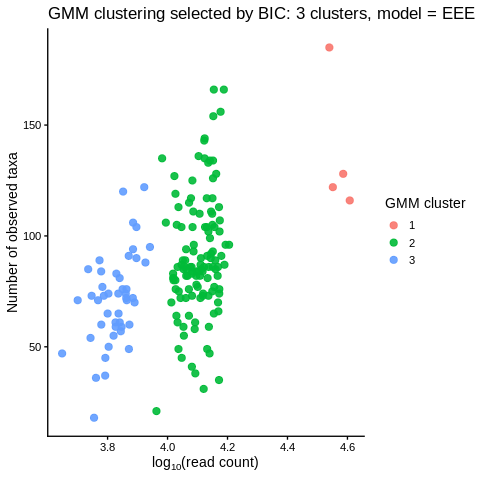

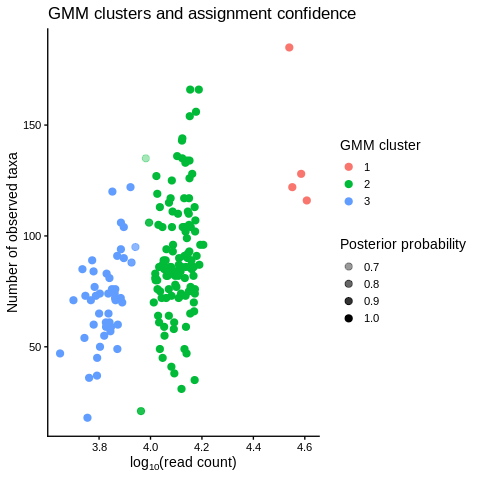

In [ ]:
%%R
# use mouted local drive
baseabtable <- read.csv('FASTexELA/data/abundance_table_fast.csv', sep=',', fileEncoding='utf-8') %>%
  column_to_rownames(., var = "index")
basemetadata <- read.csv('FASTexELA/data/metadata_fast.csv', sep=',', fileEncoding='utf-8') %>%
  column_to_rownames(., var = "Name")

readcounts <- rowSums(baseabtable)



## ------------------------------------------------------------
## GMM clustering of read count x observed taxa using BIC
## ------------------------------------------------------------

## Install packages if needed
if (!requireNamespace("mclust", quietly = TRUE)) install.packages("mclust")
if (!requireNamespace("ggplot2", quietly = TRUE)) install.packages("ggplot2")

library(mclust)
library(ggplot2)

## ------------------------------------------------------------
## 1. Prepare data
## ------------------------------------------------------------
nonzero_counts <- apply(baseabtable, 1, function(row) sum(row != 0))
qc_df <- data.frame(
  sample_id = if (!is.null(names(readcounts))) names(readcounts) else seq_along(readcounts),
  read_count = as.numeric(readcounts),
  observed_taxa = as.numeric(nonzero_counts),
  stringsAsFactors = FALSE
)

## Remove invalid rows
qc_df <- qc_df[
  !is.na(qc_df$read_count) &
    !is.na(qc_df$observed_taxa) &
    qc_df$read_count > 0,
]

rownames(qc_df) <- qc_df$sample_id

## log10-transform read count
qc_df$log10_read_count <- log10(qc_df$read_count)

## Standardize variables for GMM fitting
qc_scaled <- scale(qc_df[, c("log10_read_count", "observed_taxa")])

## ------------------------------------------------------------
## 2. Fit GMM and select model by BIC
## ------------------------------------------------------------

set.seed(123)

gmm_fit <- Mclust(
  data = qc_scaled,
  G = 1:6
)

## Show selected model
summary(gmm_fit)

## Add GMM cluster assignments
qc_df$gmm_cluster <- factor(gmm_fit$classification)

## Add posterior probability and uncertainty for diagnostics
qc_df$gmm_max_posterior <- apply(gmm_fit$z, 1, max)
qc_df$gmm_uncertainty <- gmm_fit$uncertainty

## ------------------------------------------------------------
## 3. Cluster summary
## ------------------------------------------------------------

cluster_summary <- as.data.frame(table(qc_df$gmm_cluster))
colnames(cluster_summary) <- c("gmm_cluster", "n")

print(cluster_summary)

write.csv(
  qc_df,
  file.path(out, "GMM_cluster_assignment.csv"),
  row.names = FALSE
)

write.csv(
  cluster_summary,
  file.path(out, "GMM_cluster_summary.csv"),
  row.names = FALSE
)

cat("Selected number of GMM clusters:", gmm_fit$G, "\n")
cat("Selected covariance model:", gmm_fit$modelName, "\n")

## ------------------------------------------------------------
## 4. Plot BIC values
## ------------------------------------------------------------

png(file.path(out, "GMM_BIC_plot.png"), width = 1800, height = 1400, res = 300)
plot(gmm_fit, what = "BIC")
dev.off()

## ------------------------------------------------------------
## 5. Visualize GMM clusters on original interpretable axes
## ------------------------------------------------------------

p_gmm <- ggplot(
  qc_df,
  aes(
    x = log10_read_count,
    y = observed_taxa,
    color = gmm_cluster
  )
) +
  geom_point(size = 3, alpha = 0.9) +
  labs(
    x = expression(log[10] * "(read count)"),
    y = "Number of observed taxa",
    color = "GMM cluster",
    title = paste0(
      "GMM clustering selected by BIC: ",
      gmm_fit$G, " clusters, model = ", gmm_fit$modelName
    )
  ) +
  theme_classic(base_size = 14)

print(p_gmm)

ggsave(
  filename = file.path(out, "GMM_BIC_clustered.png"),
  plot = p_gmm,
  width = 6.5,
  height = 5.5,
  dpi = 300
)

## ------------------------------------------------------------
## 6. Optional: visualize posterior assignment confidence
## ------------------------------------------------------------

p_gmm_confidence <- ggplot(
  qc_df,
  aes(
    x = log10_read_count,
    y = observed_taxa,
    color = gmm_cluster,
    alpha = gmm_max_posterior
  )
) +
  geom_point(size = 3) +
  scale_alpha_continuous(range = c(0.35, 1)) +
  labs(
    x = expression(log[10] * "(read count)"),
    y = "Number of observed taxa",
    color = "GMM cluster",
    alpha = "Posterior probability",
    title = "GMM clusters and assignment confidence"
  ) +
  theme_classic(base_size = 14)

print(p_gmm_confidence)

ggsave(
  filename = file.path(out, "GMM_BIC_clustered_with_posterior.png"),
  plot = p_gmm_confidence,
  width = 6.5,
  height = 5.5,
  dpi = 300
)


## ------------------------------------------------------------
## GMM-based outlier flag
## Retain the largest GMM cluster and exclude smaller clusters
## ------------------------------------------------------------

## GMM cluster assignment
gmm_cluster <- gmm_fit$classification

## sample labels
names(gmm_cluster) <- qc_df$sample_id

## Count samples in each GMM cluster
gmm_cluster_sizes <- table(gmm_cluster)

print(gmm_cluster_sizes)

## Identify the largest GMM cluster
largest_gmm_cluster <- as.numeric(names(gmm_cluster_sizes)[which.max(gmm_cluster_sizes)])

cat("Largest GMM cluster:", largest_gmm_cluster, "\n")

## Create outlier flag
## 0 = retained
## 1 = excluded
outlier_flag_gmm <- ifelse(
  gmm_cluster == largest_gmm_cluster,
  0,
  1
)

## Add sample labels
names(outlier_flag_gmm) <- names(gmm_cluster)

## Show result
outlier_flag_gmm

## Check numbers
table(outlier_flag_gmm)

## Test

In [ ]:
%%R
colnames(baseabtable) <- shorten_taxon_label(colnames(baseabtable))

# To group species with the same presence/absence pattern into one group,
#set grouping to 1 and specify a number between 0 and 1 for grouping_th.
# If 0, only species with the same presence/absence pattern will be grouped together.
## Make sure that the same classification labels do not appear in the abundance table. ##
list[ocmat, abmat, enmat, samplelabel, specieslabel, factorlabel, group_table] <-
  Formatting(baseabtable, basemetadata, normalize=1, parameters=c(0.01, 0.05, 0.95), grouping=1, grouping_th=0.)


enmat_p <- data.frame(FAST_score = scale(as.numeric(enmat[, 1]) ** 0.5), PPI = as.numeric(enmat[, 2]), outlier_flag = outlier_flag_gmm)
rownames(enmat_p) <- samplelabel


rows_to_keep <- !is.na(enmat_p[, 1]) & enmat_p[, 2] == 0 & enmat_p[, 3] == 0

# remove the corresponding columns from data matrices
enmat_p_filtered <- enmat_p[rows_to_keep, ]
enmat_fastscore_filtered <- as.matrix(enmat_p_filtered[, 1, drop = FALSE])
enmat_fastscore_filtered <- ceiling(10*enmat_fastscore_filtered)/10 ####
ocmat_filtered <- ocmat[rows_to_keep, , drop = FALSE]
abmat_filtered <- abmat[rows_to_keep, , drop = FALSE]
samplelabel_filtered <- samplelabel[rows_to_keep]


set.seed(42)
# Use the parameter set for the main result
totalit = 9600
lmd = 3.8
we = 1e-5
#runSA: ocmatrix, env (environmental parameters; with>SA / without>fullSA), qth (threshold for stopping computation), rep (number of fitting processes to compute mean parameter value), threads (number of parallel threads)
sa <- runSA(ocmat_filtered, enmat = enmat_fastscore_filtered, rep = 1024, threads=64, getall=FALSE, intv=200,
            totalit=totalit,lambda = lmd, we = we)

Processed 171 samples.
Threshold method: global 
Threshold value (ath): 0.01 
Occurrence threshold range: 0.05 ~ 0.95 
0  groups were found.
Selected 58 of 929 species.
Start parameter fitting
SA: elapsed time 42.88 sec



## Prepare data sets for sensitivity analysis

In [ ]:
%%R
### main
main_sa <- readRDS("FASTexELA/rds/sa_050826.rds")
main_gela <- readRDS("FASTexELA/rds/gela_050826.rds")
main_gstab <- readRDS("FASTexELA/rds/gstab_050826.rds")

In [ ]:
%%R
### taxon label
colnames(baseabtable) <- shorten_taxon_label(colnames(baseabtable))

### sa conditions

sa.parameter_sets <- sa.parameter_sets <- list(
  ## cutoff = 0.005
  p0p005_prev0p10_0p90 = c(0.005, 0.10, 0.90),
  p0p005_prev0p07_0p93 = c(0.005, 0.07, 0.93),
  p0p005_prev0p05_0p95 = c(0.005, 0.05, 0.95),
  p0p005_prev0p03_0p97 = c(0.005, 0.03, 0.97),
  p0p005_prev0p01_0p99 = c(0.005, 0.01, 0.99),

  ## cutoff = 0.008
  p0p008_prev0p10_0p90 = c(0.008, 0.10, 0.90),
  p0p008_prev0p07_0p93 = c(0.008, 0.07, 0.93),
  p0p008_prev0p05_0p95 = c(0.008, 0.05, 0.95),
  p0p008_prev0p03_0p97 = c(0.008, 0.03, 0.97),
  p0p008_prev0p01_0p99 = c(0.008, 0.01, 0.99),

  ## cutoff = 0.010
  p0p010_prev0p10_0p90 = c(0.010, 0.10, 0.90),
  p0p010_prev0p07_0p93 = c(0.010, 0.07, 0.93),
  ## main setting excluded:
  ## p0p010_prev0p05_0p95 = c(0.010, 0.05, 0.95),
  p0p010_prev0p03_0p97 = c(0.010, 0.03, 0.97),
  p0p010_prev0p01_0p99 = c(0.010, 0.01, 0.99),

  ## cutoff = 0.012
  p0p012_prev0p10_0p90 = c(0.012, 0.10, 0.90),
  p0p012_prev0p07_0p93 = c(0.012, 0.07, 0.93),
  p0p012_prev0p05_0p95 = c(0.012, 0.05, 0.95),
  p0p012_prev0p03_0p97 = c(0.012, 0.03, 0.97),
  p0p012_prev0p01_0p99 = c(0.012, 0.01, 0.99),

  ## cutoff = 0.015
  p0p015_prev0p10_0p90 = c(0.015, 0.10, 0.90),
  p0p015_prev0p07_0p93 = c(0.015, 0.07, 0.93),
  p0p015_prev0p05_0p95 = c(0.015, 0.05, 0.95),
  p0p015_prev0p03_0p97 = c(0.015, 0.03, 0.97),
  p0p015_prev0p01_0p99 = c(0.015, 0.01, 0.99)
)

length(sa.parameter_sets)


## For record
sa.parameter_table <- data.frame(
  analysis_id = names(sa.parameter_sets),
  do.call(rbind, sa.parameter_sets),
  row.names = NULL
)

colnames(sa.parameter_table) <- c(
  "analysis_id",
  "presence_threshold",
  "lower_prevalence_cutoff",
  "upper_prevalence_cutoff"
)

print(sa.parameter_table)


## ------------------------------------------------------------
## 1. Main result: number of taxa after Formatting
## ------------------------------------------------------------

main_n_taxa <- 58#

taxa_ratio_lower <- 0.75
taxa_ratio_upper <- 1.25

taxa_lower_exact <- main_n_taxa * taxa_ratio_lower
taxa_upper_exact <- main_n_taxa * taxa_ratio_upper

cat("Main number of taxa:", main_n_taxa, "\n")
cat("Allowed taxa ratio:", taxa_ratio_lower, "-", taxa_ratio_upper, "\n")
cat("Allowed exact taxa range:",
    taxa_lower_exact, "-", taxa_upper_exact, "\n")
cat("Allowed integer taxa range:",
    ceiling(taxa_lower_exact), "-", floor(taxa_upper_exact), "\n")


## ------------------------------------------------------------
## 2. Pre-screening by Formatting only
## ------------------------------------------------------------

sa.sensitivity_screening <- lapply(names(sa.parameter_sets), function(sa_id) {

  parameters_i <- sa.parameter_sets[[sa_id]]

  message("Formatting check: ", sa_id)

  fmt_i <- Formatting(
    baseabtable,
    basemetadata,
    normalize = 1,
    parameters = parameters_i,
    grouping = 1,
    grouping_th = 0.,
    reporting = FALSE
  )

  ocmat_i <- fmt_i$ocmatrix
  abmat_i <- fmt_i$abmatrix
  enmat_i <- fmt_i$fctmatrix
  samplelabel_i <- fmt_i$samplelabel
  specieslabel_i <- fmt_i$specieslabel
  factorlabel_i <- fmt_i$factorlabel
  group_table_i <- fmt_i$group_table

  n_taxa_i <- ncol(ocmat_i)
  n_samples_i <- nrow(ocmat_i)

  taxa_ratio_i <- n_taxa_i / main_n_taxa

  within_20pct_i <-
    taxa_ratio_i >= taxa_ratio_lower &
    taxa_ratio_i <= taxa_ratio_upper

  data.frame(
    analysis_id = sa_id,

    presence_threshold = parameters_i[1],
    lower_prevalence_cutoff = parameters_i[2],
    upper_prevalence_cutoff = parameters_i[3],
    max_relative_abundance_cutoff = parameters_i[4],

    n_samples_after_formatting = n_samples_i,
    n_taxa_after_formatting = n_taxa_i,

    main_n_taxa = main_n_taxa,
    taxa_ratio_to_main = taxa_ratio_i,
    within_20pct_taxa_range = within_20pct_i,
    runSA_selected = within_20pct_i,

    stringsAsFactors = FALSE
  )
})

sa.sensitivity_screening <- do.call(rbind, sa.sensitivity_screening)
rownames(sa.sensitivity_screening) <- NULL

print(sa.sensitivity_screening)

cat(
  "Selected for runSA:",
  sum(sa.sensitivity_screening$runSA_selected),
  "of",
  nrow(sa.sensitivity_screening),
  "conditions\n"
)

write.csv(
  sa.sensitivity_screening,
  file = file.path(out, "sa_sensitivity_screening.csv"),
  row.names = FALSE
)

            analysis_id presence_threshold lower_prevalence_cutoff
1  p0p005_prev0p10_0p90              0.005                    0.10
2  p0p005_prev0p07_0p93              0.005                    0.07
3  p0p005_prev0p05_0p95              0.005                    0.05
4  p0p005_prev0p03_0p97              0.005                    0.03
5  p0p005_prev0p01_0p99              0.005                    0.01
6  p0p008_prev0p10_0p90              0.008                    0.10
7  p0p008_prev0p07_0p93              0.008                    0.07
8  p0p008_prev0p05_0p95              0.008                    0.05
9  p0p008_prev0p03_0p97              0.008                    0.03
10 p0p008_prev0p01_0p99              0.008                    0.01
11 p0p010_prev0p10_0p90              0.010                    0.10
12 p0p010_prev0p07_0p93              0.010                    0.07
13 p0p010_prev0p03_0p97              0.010                    0.03
14 p0p010_prev0p01_0p99              0.010                    

In [ ]:
%%R

## ------------------------------------------------------------
## 3. Parameter sets selected for runSA
## ------------------------------------------------------------

selected_ids <- sa.sensitivity_screening$analysis_id[
  sa.sensitivity_screening$runSA_selected
]

sa.parameter_sets_selected <- sa.parameter_sets[selected_ids]

print(selected_ids)

cat(
  "Number of selected parameter sets:",
  length(sa.parameter_sets_selected),
  "\n"
)


## ------------------------------------------------------------
## 4. Run SA only for selected sensitivity-analysis conditions
## ------------------------------------------------------------

totalit <- 9600
lmd <- 3.8
we <- 1e-5

sa_rep <- 1024
sa_threads <- 64
sa_intv <- 200

sa.sensitivity_analysis <- lapply(names(sa.parameter_sets_selected), function(sa_id) {

  parameters_i <- sa.parameter_sets_selected[[sa_id]]

  message("------------------------------------------------------------")
  message("Running runSA for selected condition: ", sa_id)
  message("parameters = c(", paste(parameters_i, collapse = ", "), ")")
  message("------------------------------------------------------------")

  ## Formatting
  fmt_i <- Formatting(
    baseabtable,
    basemetadata,
    normalize = 1,
    parameters = parameters_i,
    grouping = 1,
    grouping_th = 0.,
    reporting = TRUE
  )

  ocmat_i <- fmt_i$ocmatrix
  abmat_i <- fmt_i$abmatrix
  enmat_i <- fmt_i$fctmatrix
  samplelabel_i <- fmt_i$samplelabel
  specieslabel_i <- fmt_i$specieslabel
  factorlabel_i <- fmt_i$factorlabel
  group_table_i <- fmt_i$group_table

  ## Align outlier flag if it has sample names.
  ## If outlier_flag_gmm is unnamed, this falls back to the original vector order.
  outlier_flag_i <- outlier_flag_gmm
  if (!is.null(names(outlier_flag_gmm))) {
    outlier_flag_i <- outlier_flag_gmm[samplelabel_i]
  }

  ## Environmental matrix
  ## This is equivalent to scale(sqrt(FAST)) for complete values,
  ## but handles missing FAST values safely.
  fast_sqrt_i <- as.numeric(enmat_i[, 1]) ** 0.5
  fast_scaled_i <- (fast_sqrt_i - mean(fast_sqrt_i, na.rm = TRUE)) /
    sd(fast_sqrt_i, na.rm = TRUE)

  enmat_p_i <- data.frame(
    FAST_score = fast_scaled_i,
    PPI = as.numeric(enmat_i[, 2]),
    outlier_flag = outlier_flag_i
  )

  rownames(enmat_p_i) <- samplelabel_i

  rows_to_keep_i <-
    !is.na(enmat_p_i[, 1]) &
    enmat_p_i[, 2] == 0 &
    enmat_p_i[, 3] == 0

  ## Filter matrices
  enmat_p_filtered_i <- enmat_p_i[rows_to_keep_i, , drop = FALSE]

  enmat_fastscore_filtered_i <- as.matrix(
    enmat_p_filtered_i[, 1, drop = FALSE]
  )

  enmat_fastscore_filtered_i <-
    ceiling(10 * enmat_fastscore_filtered_i) / 10

  ocmat_filtered_i <- ocmat_i[rows_to_keep_i, , drop = FALSE]
  abmat_filtered_i <- abmat_i[rows_to_keep_i, , drop = FALSE]
  samplelabel_filtered_i <- samplelabel_i[rows_to_keep_i]

  ## Parameter estimation
  set.seed(42)

  sa_i <- runSA(
    ocmat_filtered_i,
    enmat = enmat_fastscore_filtered_i,
    rep = sa_rep,
    threads = sa_threads,
    getall = FALSE,
    intv = sa_intv,
    totalit = totalit,
    lambda = lmd,
    we = we
  )

  out_i <- list(
    analysis_id = sa_id,
    parameters = parameters_i,

    sa = sa_i,

    ocmat = ocmat_i,
    abmat = abmat_i,
    enmat = enmat_i,
    enmat_p = enmat_p_i,

    ocmat_filtered = ocmat_filtered_i,
    abmat_filtered = abmat_filtered_i,
    enmat_p_filtered = enmat_p_filtered_i,
    enmat_fastscore_filtered = enmat_fastscore_filtered_i,

    samplelabel = samplelabel_i,
    samplelabel_filtered = samplelabel_filtered_i,
    specieslabel = specieslabel_i,
    factorlabel = factorlabel_i,
    group_table = group_table_i,

    n_samples_after_formatting = nrow(ocmat_i),
    n_taxa_after_formatting = ncol(ocmat_i),
    n_samples_after_filtering = nrow(ocmat_filtered_i),
    n_taxa_after_filtering = ncol(ocmat_filtered_i),
    taxa_ratio_to_main = ncol(ocmat_i) / main_n_taxa
  )

  gc()

  return(out_i)
})

names(sa.sensitivity_analysis) <- names(sa.parameter_sets_selected)

## Attach screening table as metadata
attr(sa.sensitivity_analysis, "screening_table") <- sa.sensitivity_screening


## ------------------------------------------------------------
## 5. Summary of actually fitted sensitivity-analysis results
## ------------------------------------------------------------

sa.sensitivity_summary <- data.frame(
  analysis_id = names(sa.sensitivity_analysis),

  presence_threshold = sapply(sa.sensitivity_analysis, function(x) x$parameters[1]),
  lower_prevalence_cutoff = sapply(sa.sensitivity_analysis, function(x) x$parameters[2]),
  upper_prevalence_cutoff = sapply(sa.sensitivity_analysis, function(x) x$parameters[3]),
  max_relative_abundance_cutoff = sapply(sa.sensitivity_analysis, function(x) x$parameters[4]),

  n_samples_after_formatting = sapply(sa.sensitivity_analysis, function(x) x$n_samples_after_formatting),
  n_taxa_after_formatting = sapply(sa.sensitivity_analysis, function(x) x$n_taxa_after_formatting),
  n_samples_after_filtering = sapply(sa.sensitivity_analysis, function(x) x$n_samples_after_filtering),
  n_taxa_after_filtering = sapply(sa.sensitivity_analysis, function(x) x$n_taxa_after_filtering),
  taxa_ratio_to_main = sapply(sa.sensitivity_analysis, function(x) x$taxa_ratio_to_main),

  row.names = NULL
)

print(sa.sensitivity_summary)


 [1] "p0p005_prev0p10_0p90" "p0p005_prev0p07_0p93" "p0p005_prev0p05_0p95"
 [4] "p0p005_prev0p03_0p97" "p0p008_prev0p10_0p90" "p0p008_prev0p07_0p93"
 [7] "p0p008_prev0p05_0p95" "p0p008_prev0p03_0p97" "p0p010_prev0p07_0p93"
[10] "p0p010_prev0p03_0p97" "p0p010_prev0p01_0p99" "p0p012_prev0p07_0p93"
[13] "p0p012_prev0p05_0p95" "p0p012_prev0p03_0p97" "p0p012_prev0p01_0p99"
[16] "p0p015_prev0p05_0p95" "p0p015_prev0p03_0p97" "p0p015_prev0p01_0p99"
Number of selected parameter sets: 18 
Processed 171 samples.
Threshold method: global 
Threshold value (ath): 0.005 
Occurrence threshold range: 0.1 ~ 0.9 
0  groups were found.
Selected 50 of 929 species.
Start parameter fitting
SA: elapsed time 32.14 sec

Processed 171 samples.
Threshold method: global 
Threshold value (ath): 0.005 
Occurrence threshold range: 0.07 ~ 0.93 
0  groups were found.
Selected 59 of 929 species.
Start parameter fitting
SA: elapsed time 43.11 sec

Processed 171 samples.
Threshold method: global 
Threshold value (ath): 0.0

In [ ]:
#%%R
# save
#saveRDS(sa.sensitivity_analysis, file.path(out, "sa_sensitivity_analysis.rds"))

In [ ]:
%%R

## ------------------------------------------------------------
## Apply GradELA and gStability to all sensitivity-analysis results
## ------------------------------------------------------------

overwrite_gela <- TRUE
overwrite_gstab <- TRUE

for (sa_id in names(sa.sensitivity_analysis)) {

  message("------------------------------------------------------------")
  message("Processing: ", sa_id)
  message("------------------------------------------------------------")

  sa_i <- sa.sensitivity_analysis[[sa_id]]$sa
  ocmat_i <- sa.sensitivity_analysis[[sa_id]]$ocmat_filtered
  enmat_i <- sa.sensitivity_analysis[[sa_id]]$enmat_fastscore_filtered

  if (is.null(sa_i)) {
    warning("No sa found for: ", sa_id)
    next
  }

  if (is.null(ocmat_i)) {
    warning("No ocmat_filtered found for: ", sa_id)
    next
  }

  if (is.null(enmat_i)) {
    warning("No enmat_fastscore_filtered found for: ", sa_id)
    next
  }

  ## ------------------------------------------------------------
  ## GradELA
  ## ------------------------------------------------------------

  if (
    isTRUE(overwrite_gela) ||
      is.null(sa.sensitivity_analysis[[sa_id]]$gela)
  ) {

    message("Running GradELA for: ", sa_id)

    gela_i <- GradELA(
      sa = sa_i,
      eid = "FAST_score",
      enmat = enmat_i,
      env = NULL,
      range = c(-2., 2.),
      steps = 41,
      th = 0.1,
      threads = 64
    )

    sa.sensitivity_analysis[[sa_id]]$gela <- gela_i

  } else {

    message("Skipping GradELA; existing gela found for: ", sa_id)
  }

  ## ------------------------------------------------------------
  ## gStability
  ## ------------------------------------------------------------

  if (
    isTRUE(overwrite_gstab) ||
      is.null(sa.sensitivity_analysis[[sa_id]]$gstab)
  ) {

    message("Running gStability for: ", sa_id)

    gstab_i <- gStability(
      sa = sa_i,
      ocmat = ocmat_i,
      enmat = enmat_i,
      th = 0.1,
      threads = 64,
      reporting = TRUE
    )

    sa.sensitivity_analysis[[sa_id]]$gstab <- gstab_i

  } else {

    message("Skipping gStability; existing gstab found for: ", sa_id)
  }

  gc()
}

## ------------------------------------------------------------
## Check
## ------------------------------------------------------------

check_gela_gstab <- data.frame(
  analysis_id = names(sa.sensitivity_analysis),
  has_gela = sapply(sa.sensitivity_analysis, function(x) !is.null(x$gela)),
  has_gstab = sapply(sa.sensitivity_analysis, function(x) !is.null(x$gstab)),
  stringsAsFactors = FALSE
)

print(check_gela_gstab)


env not specified, the mean of enmat is used
processing(41) |=========================================|
Elapsed time 89.26 sec
Start gStability:
gStability: elapsed time 32.81 sec

env not specified, the mean of enmat is used
processing(41) |=========================================|
Elapsed time 389.78 sec
Start gStability:
gStability: elapsed time 127.49 sec

env not specified, the mean of enmat is used
processing(41) |=========================================|
Elapsed time 506.83 sec
Start gStability:
gStability: elapsed time 156.62 sec

env not specified, the mean of enmat is used
processing(41) |=========================================|
Elapsed time 574.67 sec
Start gStability:
gStability: elapsed time 244.18 sec

env not specified, the mean of enmat is used
processing(41) |=========================================|
Elapsed time 64.27 sec
Start gStability:
gStability: elapsed time 23.11 sec

env not specified, the mean of enmat is used
processing(41) |============================

In [ ]:
#%%R
# save
#saveRDS(
#  sa.sensitivity_analysis,
#  file.path(out, "sa_sensitivity_analysis_with_gela_gstab.rds")
#)

In [ ]:
%%R

## ------------------------------------------------------------
## Taxon presence/absence table across main and sensitivity SA objects
## ------------------------------------------------------------

main_sa <- readRDS("FASTexELA/rds/sa_050826.rds")

if (is.null(names(sa.sensitivity_analysis))) {
  names(sa.sensitivity_analysis) <- paste0(
    "SA_",
    seq_along(sa.sensitivity_analysis)
  )
}

## ------------------------------------------------------------
## Helper: extract taxa from SA object
## ------------------------------------------------------------

extract_taxa_from_sa <- function(sa_obj) {

  params <- sa2params(sa_obj)

  if (!is.null(params[[3]])) {
    taxa <- rownames(as.matrix(params[[3]]))
  } else {
    taxa <- rownames(as.matrix(params[[2]]))
  }

  as.character(taxa)
}

## ------------------------------------------------------------
## 1. Main taxa
## ------------------------------------------------------------

main_taxa <- extract_taxa_from_sa(main_sa)

## ------------------------------------------------------------
## 2. Sensitivity-analysis taxa
## ------------------------------------------------------------

sens_taxa_list <- list()

for (sa_id in names(sa.sensitivity_analysis)) {

  sa_i <- sa.sensitivity_analysis[[sa_id]]$sa

  if (is.null(sa_i)) {
    warning("No sa found for: ", sa_id)
    next
  }

  sens_taxa_list[[sa_id]] <- extract_taxa_from_sa(sa_i)
}

## ------------------------------------------------------------
## 3. Union of all taxa
## ------------------------------------------------------------

all_taxa <- sort(
  unique(
    c(
      main_taxa,
      unlist(sens_taxa_list, use.names = FALSE)
    )
  )
)

## ------------------------------------------------------------
## 4. Presence/absence matrix
## ------------------------------------------------------------

analysis_cols <- c("main", names(sens_taxa_list))

taxon_presence_mat <- matrix(
  0,
  nrow = length(all_taxa),
  ncol = length(analysis_cols),
  dimnames = list(
    all_taxa,
    analysis_cols
  )
)

taxon_presence_mat[main_taxa, "main"] <- 1

for (sa_id in names(sens_taxa_list)) {
  taxa_i <- sens_taxa_list[[sa_id]]
  taxon_presence_mat[taxa_i, sa_id] <- 1
}

## ------------------------------------------------------------
## 5. Add taxon-wise summary columns
## ------------------------------------------------------------
## Total: number of parameter sets in which each taxon is present
## Ratio: proportion of parameter sets in which each taxon is present

taxon_presence_table <- as.data.frame(
  taxon_presence_mat,
  check.names = FALSE
)

taxon_presence_table$Total <- rowSums(taxon_presence_mat)
taxon_presence_table$Ratio <- rowMeans(taxon_presence_mat)

## ------------------------------------------------------------
## 6. Add parameter-set-wise summary rows
## ------------------------------------------------------------
## Total row: number of taxa included in each parameter set
## Ratio row: proportion relative to the union of all taxa

total_row <- c(
  colSums(taxon_presence_mat),
  Total = sum(taxon_presence_table$Total),
  Ratio = NA_real_
)

ratio_row <- c(
  colMeans(taxon_presence_mat),
  Total = NA_real_,
  Ratio = mean(taxon_presence_table$Ratio)
)

taxon_presence_table <- rbind(
  taxon_presence_table,
  Total = total_row,
  Ratio = ratio_row
)

## ------------------------------------------------------------
## 7. Output
## ------------------------------------------------------------

print(taxon_presence_table)

write.csv(
   taxon_presence_table,
   file = file.path(out, "taxon_presence_by_parameter_set.csv"),
   row.names = TRUE
 )

                                            main p0p005_prev0p10_0p90
Agathobacter.uc                        1.0000000            1.0000000
Anaerostipes_hadrus                    1.0000000            1.0000000
Bacteroides_cellulosilyticus           0.0000000            0.0000000
Bacteroides_coprocola                  1.0000000            1.0000000
Bacteroides_coprophilus                1.0000000            0.0000000
Bacteroides_dorei                      1.0000000            1.0000000
Bacteroides_eggerthii                  1.0000000            1.0000000
Bacteroides_fragilis                   1.0000000            1.0000000
Bacteroides_massiliensis               1.0000000            1.0000000
Bacteroides_ovatus                     1.0000000            1.0000000
Bacteroides_plebeius                   1.0000000            1.0000000
Bacteroides_stercoris                  1.0000000            1.0000000
Bacteroides_thetaiotaomicron           1.0000000            1.0000000
Bacteroides_uniformi

## Stable state diagram

In [ ]:
%%R

dir.create(out, showWarnings = FALSE, recursive = TRUE)

ssd_png_table <- data.frame(
  analysis_id = character(0),
  png_file = character(0),
  stringsAsFactors = FALSE
)

for (i in seq_along(sa.sensitivity_analysis)) {

  sa_id <- names(sa.sensitivity_analysis)[i]

  message("------------------------------------------------------------")
  message("Running showSSD2 for: ", sa_id)
  message("------------------------------------------------------------")

  if (is.null(sa.sensitivity_analysis[[i]]$gela)) {
    warning("No gela found for: ", sa_id)
    next
  }

  file_base <- file.path(out, paste0("ssd_", sa_id))

  ssd2 <- showSSD2(
    gela = sa.sensitivity_analysis[[i]]$gela,
    sa = sa.sensitivity_analysis[[i]]$sa,
    gstab = sa.sensitivity_analysis[[i]]$gstab,
    filter_by_gstab = TRUE,
    grouping = TRUE,
    min_group_size = 3,
    min_distance = 3,
    device = "png",
    file = file_base,
    width_px = 1800,
    height_px = 2000,
    res_dpi = 300,
    bg = "white",
    xlab = expression(epsilon[FAST])
  )

  ## Store results back into the same object
  sa.sensitivity_analysis[[i]]$ssd2 <- ssd2
  sa.sensitivity_analysis[[i]]$ssd_grouping <- ssd2$groups

  ## Record actual output file path from showSSD2
  png_file_i <- ssd2$params$output_files[
    grepl("\\.png$", ssd2$params$output_files)
  ]

  if (length(png_file_i) == 0) {
    warning("PNG output file was not recorded for: ", sa_id)
    png_file_i <- NA_character_
  }

  sa.sensitivity_analysis[[i]]$ssd_png_file <- png_file_i[1]

  ssd_png_table <- rbind(
    ssd_png_table,
    data.frame(
      analysis_id = sa_id,
      png_file = png_file_i[1],
      stringsAsFactors = FALSE
    )
  )

  gc()
}

print(ssd_png_table)

Keeping groups represented by observed samples in gstab:
  old C1 -> new C1
  old C2 -> new C2
  old C3 -> new C3
  old C5 -> new C4
  old C6 -> new C5 
Keeping groups represented by observed samples in gstab:
  old C1 -> new C1
  old C3 -> new C2
  old C4 -> new C3
  old C5 -> new C4
  old C6 -> new C5
  old C7 -> new C6
  old C8 -> new C7
  old C9 -> new C8
  old C10 -> new C9 
Keeping groups represented by observed samples in gstab:
  old C1 -> new C1
  old C3 -> new C2
  old C4 -> new C3
  old C5 -> new C4
  old C7 -> new C5 
Keeping groups represented by observed samples in gstab:
  old C1 -> new C1
  old C2 -> new C2
  old C3 -> new C3
  old C4 -> new C4
  old C5 -> new C5
  old C8 -> new C6 
Keeping groups represented by observed samples in gstab:
  old C1 -> new C1
  old C2 -> new C2
  old C3 -> new C3 
Keeping groups represented by observed samples in gstab:
  old C1 -> new C1
  old C2 -> new C2
  old C3 -> new C3
  old C4 -> new C4
  old C6 -> new C5
  old C10 -> new C6
  old

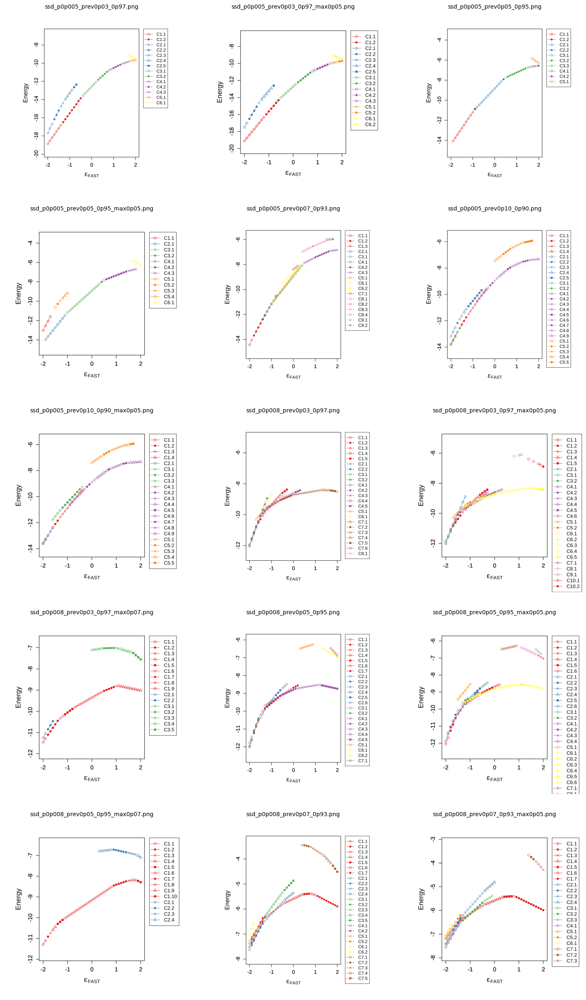

Saved: /content/ela_fast/results/ssd_sensitivity_panel.png


In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image

# out フォルダ内の ssd_*.png を取得
png_files = sorted([
    os.path.join(out, f)
    for f in os.listdir(out)
    if f.startswith("ssd_") and f.endswith(".png")
])

ncol = 3
nrow = 5
max_panels = ncol * nrow

files_to_show = png_files[:max_panels]

fig, axes = plt.subplots(nrow, ncol, figsize=(15, 25))
axes = axes.flatten()

for ax, f in zip(axes, files_to_show):
    img = Image.open(f)
    ax.imshow(img)
    ax.set_title(os.path.basename(f), fontsize=10, pad=8)
    ax.axis("off")

# 余った枠を空白に
for ax in axes[len(files_to_show):]:
    ax.axis("off")

# tight_layout より少し余白を明示的に確保
plt.subplots_adjust(
    left=0.02,
    right=0.98,
    top=0.98,
    bottom=0.02,
    wspace=0.08,
    hspace=0.15
)

combined_file = os.path.join(out, "ssd_sensitivity_panel.png")

plt.savefig(
    combined_file,
    dpi=300,
    bbox_inches="tight",
    pad_inches=0.3
)

plt.show()

print("Saved:", combined_file)

In [ ]:
%%R

dir.create(out, showWarnings = FALSE, recursive = TRUE)

ss_group_png_table <- data.frame(
  analysis_id = character(0),
  png_file = character(0),
  stringsAsFactors = FALSE
)

for (i in seq_along(sa.sensitivity_analysis)) {

  sa_id <- names(sa.sensitivity_analysis)[i]

  message("------------------------------------------------------------")
  message("Running ss_group_plot for: ", sa_id)
  message("------------------------------------------------------------")

  ssd_grouping_i <- sa.sensitivity_analysis[[i]]$ssd_grouping

  if (is.null(ssd_grouping_i)) {
    warning("No ssd_grouping found for: ", sa_id)
    next
  }

  ## Taxon names must match this sensitivity-analysis result
  taxa_names_i <- rownames(sa.sensitivity_analysis[[i]]$sa[[1]])

  ## g_FAST for this sensitivity-analysis result
  sa2p_i <- sa2params(sa.sensitivity_analysis[[i]]$sa)
  ge_i <- sa2p_i[[3]][, 1]
  order_i <- order(ge_i)

  file_base <- file.path(out, paste0("ss_group_plot_", sa_id))

  p <- ss_group_plot(
    ssd_grouping = ssd_grouping_i,
    order = order_i,
    taxa_names = taxa_names_i,
    device = c("png", "eps"),
    file = file_base,
    width_px = 1800,
    height_px = 1800,
    res_dpi = 300
  )

  sa.sensitivity_analysis[[i]]$ss_group_plot_result <- p

  output_files_i <- attr(p, "output_files")
  png_file_i <- output_files_i[grepl("\\.png$", output_files_i)]

  if (length(png_file_i) == 0) {
    png_file_i <- paste0(file_base, ".png")
  }

  if (!file.exists(png_file_i[1])) {
    warning("PNG file was not found for: ", sa_id, " -> ", png_file_i[1])
  }

  sa.sensitivity_analysis[[i]]$ss_group_plot_png_file <- png_file_i[1]

  ss_group_png_table <- rbind(
    ss_group_png_table,
    data.frame(
      analysis_id = sa_id,
      png_file = png_file_i[1],
      stringsAsFactors = FALSE
    )
  )

  gc()
}


print(ss_group_png_table)

            analysis_id
1  p0p005_prev0p10_0p90
2  p0p005_prev0p07_0p93
3  p0p005_prev0p05_0p95
4  p0p005_prev0p03_0p97
5  p0p008_prev0p10_0p90
6  p0p008_prev0p07_0p93
7  p0p008_prev0p05_0p95
8  p0p008_prev0p03_0p97
9  p0p010_prev0p07_0p93
10 p0p010_prev0p03_0p97
11 p0p010_prev0p01_0p99
12 p0p012_prev0p07_0p93
13 p0p012_prev0p05_0p95
14 p0p012_prev0p03_0p97
15 p0p012_prev0p01_0p99
16 p0p015_prev0p05_0p95
17 p0p015_prev0p03_0p97
18 p0p015_prev0p01_0p99
                                                           png_file
1  /content/ela_fast/results/ss_group_plot_p0p005_prev0p10_0p90.png
2  /content/ela_fast/results/ss_group_plot_p0p005_prev0p07_0p93.png
3  /content/ela_fast/results/ss_group_plot_p0p005_prev0p05_0p95.png
4  /content/ela_fast/results/ss_group_plot_p0p005_prev0p03_0p97.png
5  /content/ela_fast/results/ss_group_plot_p0p008_prev0p10_0p90.png
6  /content/ela_fast/results/ss_group_plot_p0p008_prev0p07_0p93.png
7  /content/ela_fast/results/ss_group_plot_p0p008_prev0p05_0p95.png


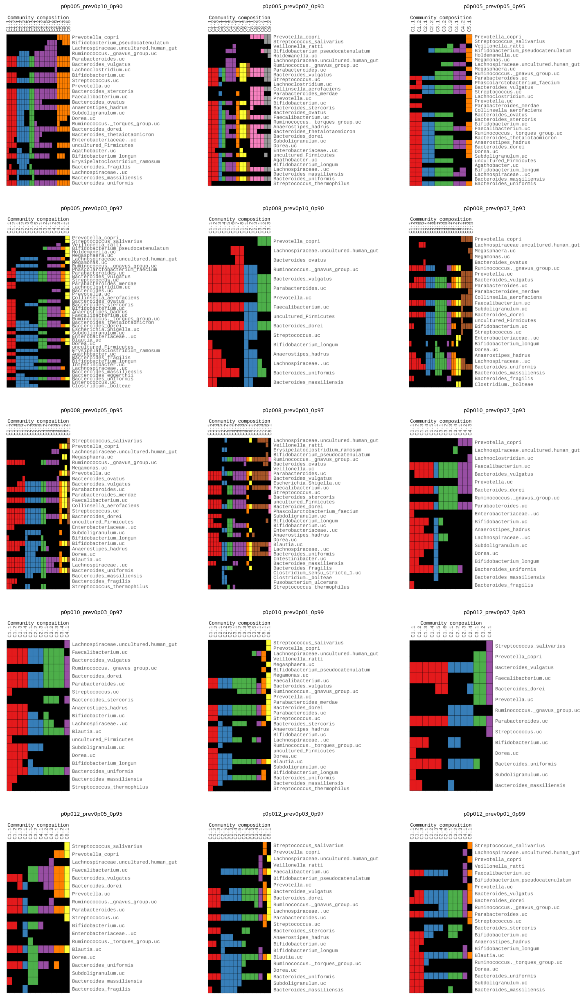

Saved: /content/ela_fast/results/ss_group_sensitivity_panel.png


In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

ss_group_files = pd.read_csv(f"{out}/ss_group_plot_png_files.csv")

ss_group_files = ss_group_files[
    ss_group_files["png_file"].apply(
        lambda x: isinstance(x, str) and os.path.exists(x)
    )
]

ncol = 3
nrow = 5
max_panels = ncol * nrow

ss_group_files_show = ss_group_files.iloc[:max_panels, :]

fig, axes = plt.subplots(nrow, ncol, figsize=(15, 25))
axes = axes.flatten()

for ax, (_, row) in zip(axes, ss_group_files_show.iterrows()):
    img = Image.open(row["png_file"])
    ax.imshow(img)
    ax.set_title(row["analysis_id"], fontsize=9, pad=8)
    ax.axis("off")

for ax in axes[len(ss_group_files_show):]:
    ax.axis("off")

plt.subplots_adjust(
    left=0.02,
    right=0.98,
    top=0.98,
    bottom=0.02,
    wspace=0.08,
    hspace=0.15
)

combined_file = os.path.join(out, "ss_group_sensitivity_panel.png")

plt.savefig(
    combined_file,
    dpi=300,
    bbox_inches="tight",
    pad_inches=0.3
)

plt.show()

print("Saved:", combined_file)

In [ ]:
%%R

## ------------------------------------------------------------
## Taxon presence/absence table across stable-state memberships
##   + mean FAST position of stable states containing each taxon
## ------------------------------------------------------------

main_sa <- readRDS("FASTexELA/rds/sa_050826.rds")
main_gela <- readRDS("FASTexELA/rds/gela_050826.rds")

if (is.null(names(sa.sensitivity_analysis))) {
  names(sa.sensitivity_analysis) <- paste0(
    "SA_",
    seq_along(sa.sensitivity_analysis)
  )
}

## ------------------------------------------------------------
## Helper: extract taxa from SA object
## ------------------------------------------------------------

extract_taxa_from_sa <- function(sa_obj) {

  params <- sa2params(sa_obj)

  if (!is.null(params[[3]])) {
    taxa <- rownames(as.matrix(params[[3]]))
  } else {
    taxa <- rownames(as.matrix(params[[2]]))
  }

  as.character(taxa)
}

## ------------------------------------------------------------
## Helper: integrate all stable-state memberships in one ssd_grouping
## ------------------------------------------------------------
## ssd_grouping[[group]][[subgroup]][[1]] が0/1 membership vector。
## どの安定状態に出るかは区別せず、全ベクトルを OR で統合する。

extract_stable_taxa_from_ssd <- function(ssd_grouping, taxa_names) {

  if (is.null(ssd_grouping) || length(ssd_grouping) == 0) {
    return(character(0))
  }

  membership_list <- list()

  for (g in seq_along(ssd_grouping)) {

    group_i <- ssd_grouping[[g]]

    for (s in seq_along(group_i)) {

      v <- as.integer(group_i[[s]][[1]])

      if (length(v) != length(taxa_names)) {
        stop(
          "Membership vector length does not match the number of taxa: ",
          length(v), " vs ", length(taxa_names)
        )
      }

      membership_list[[length(membership_list) + 1]] <- v
    }
  }

  if (length(membership_list) == 0) {
    return(character(0))
  }

  stable_membership <- Reduce(
    function(a, b) as.integer((a + b) > 0),
    membership_list
  )

  taxa_names[stable_membership == 1]
}

## ------------------------------------------------------------
## Helper: extract FAST values where each taxon appears in stable states
## ------------------------------------------------------------
## ssd_grouping[[group]][[subgroup]][[1]] : 0/1 membership vector
## ssd_grouping[[group]][[subgroup]][[2]] : energy vector along FAST grid
## gela[[2]]                              : FAST grid

extract_stable_taxon_fast_values <- function(ssd_grouping,
                                             taxa_names,
                                             fast_grid) {

  if (is.null(ssd_grouping) || length(ssd_grouping) == 0) {
    return(list())
  }

  fast_grid <- as.numeric(fast_grid)

  out <- vector("list", length(taxa_names))
  names(out) <- taxa_names

  for (g in seq_along(ssd_grouping)) {

    group_i <- ssd_grouping[[g]]

    for (s in seq_along(group_i)) {

      membership <- as.integer(group_i[[s]][[1]])
      energy <- as.numeric(group_i[[s]][[2]])

      if (length(membership) != length(taxa_names)) {
        stop(
          "Membership vector length does not match the number of taxa: ",
          length(membership), " vs ", length(taxa_names)
        )
      }

      if (length(energy) != length(fast_grid)) {
        stop(
          "Energy vector length does not match FAST grid length: ",
          length(energy), " vs ", length(fast_grid)
        )
      }

      fast_vals <- fast_grid[is.finite(energy)]

      if (length(fast_vals) == 0) {
        next
      }

      present_taxa <- taxa_names[membership == 1]

      for (tx in present_taxa) {
        out[[tx]] <- c(out[[tx]], fast_vals)
      }
    }
  }

  out[lengths(out) > 0]
}

append_taxon_fast_values <- function(x, y) {

  for (tx in names(y)) {
    x[[tx]] <- c(x[[tx]], y[[tx]])
  }

  x
}

summarize_taxon_fast_values <- function(fast_values_list) {

  if (length(fast_values_list) == 0) {
    return(data.frame(
      taxon = character(),
      Mean_FAST_stable_state = numeric(),
      Min_FAST_stable_state = numeric(),
      Max_FAST_stable_state = numeric(),
      N_FAST_stable_state_points = integer(),
      stringsAsFactors = FALSE
    ))
  }

  do.call(
    rbind,
    lapply(names(fast_values_list), function(tx) {

      v <- as.numeric(fast_values_list[[tx]])

      data.frame(
        taxon = tx,
        Mean_FAST_stable_state = mean(v, na.rm = TRUE),
        Min_FAST_stable_state = min(v, na.rm = TRUE),
        Max_FAST_stable_state = max(v, na.rm = TRUE),
        N_FAST_stable_state_points = length(v),
        stringsAsFactors = FALSE
      )
    })
  )
}

## ------------------------------------------------------------
## 1. Recompute main SSD grouping
## ------------------------------------------------------------

main_ssd2 <- showSSD2(
  gela = main_gela,
  sa = main_sa,
  grouping = TRUE,
  min_group_size = 3,
  min_distance = 3,
  device = "none"
)

main_ssd_grouping_current <- main_ssd2$groups

main_taxa <- extract_taxa_from_sa(main_sa)

main_stable_taxa <- extract_stable_taxa_from_ssd(
  ssd_grouping = main_ssd_grouping_current,
  taxa_names = main_taxa
)

stable_fast_values_all <- list()

main_fast_values <- extract_stable_taxon_fast_values(
  ssd_grouping = main_ssd_grouping_current,
  taxa_names = main_taxa,
  fast_grid = main_gela[[2]]
)

stable_fast_values_all <- append_taxon_fast_values(
  stable_fast_values_all,
  main_fast_values
)

## ------------------------------------------------------------
## 2. Sensitivity-analysis stable-state taxa
## ------------------------------------------------------------

sens_stable_taxa_list <- list()

for (sa_id in names(sa.sensitivity_analysis)) {

  sa_i <- sa.sensitivity_analysis[[sa_id]]$sa
  ssd_grouping_i <- sa.sensitivity_analysis[[sa_id]]$ssd_grouping
  gela_i <- sa.sensitivity_analysis[[sa_id]]$gela

  if (is.null(sa_i)) {
    warning("No sa found for: ", sa_id)
    next
  }

  if (is.null(ssd_grouping_i)) {
    warning("No ssd_grouping found for: ", sa_id)
    next
  }

  taxa_i <- extract_taxa_from_sa(sa_i)

  sens_stable_taxa_list[[sa_id]] <- extract_stable_taxa_from_ssd(
    ssd_grouping = ssd_grouping_i,
    taxa_names = taxa_i
  )

  if (!is.null(gela_i)) {

    fast_values_i <- extract_stable_taxon_fast_values(
      ssd_grouping = ssd_grouping_i,
      taxa_names = taxa_i,
      fast_grid = gela_i[[2]]
    )

    stable_fast_values_all <- append_taxon_fast_values(
      stable_fast_values_all,
      fast_values_i
    )

  } else {
    warning("No gela found for FAST-position summary: ", sa_id)
  }
}

## ------------------------------------------------------------
## 3. Union of all taxa appearing in stable states
## ------------------------------------------------------------

all_stable_taxa <- sort(
  unique(
    c(
      main_stable_taxa,
      unlist(sens_stable_taxa_list, use.names = FALSE)
    )
  )
)

## ------------------------------------------------------------
## 4. Presence/absence matrix
## ------------------------------------------------------------

analysis_cols <- c("main", names(sens_stable_taxa_list))

stable_taxon_presence_mat <- matrix(
  0,
  nrow = length(all_stable_taxa),
  ncol = length(analysis_cols),
  dimnames = list(
    all_stable_taxa,
    analysis_cols
  )
)

stable_taxon_presence_mat[main_stable_taxa, "main"] <- 1

for (sa_id in names(sens_stable_taxa_list)) {
  taxa_i <- sens_stable_taxa_list[[sa_id]]
  stable_taxon_presence_mat[taxa_i, sa_id] <- 1
}

## ------------------------------------------------------------
## 5. Add taxon-wise summary columns
## ------------------------------------------------------------
## Total: number of datasets whose stable states include the taxon
## Ratio: proportion of datasets whose stable states include the taxon

stable_taxon_membership_table <- as.data.frame(
  stable_taxon_presence_mat,
  check.names = FALSE
)

stable_taxon_membership_table$Total <- rowSums(stable_taxon_presence_mat)
stable_taxon_membership_table$Ratio <- rowMeans(stable_taxon_presence_mat)

## ------------------------------------------------------------
## 5b. Add FAST-position summary columns
## ------------------------------------------------------------

stable_fast_summary <- summarize_taxon_fast_values(
  stable_fast_values_all
)

stable_taxon_membership_table$Mean_FAST_stable_state <- NA_real_
stable_taxon_membership_table$Min_FAST_stable_state <- NA_real_
stable_taxon_membership_table$Max_FAST_stable_state <- NA_real_
stable_taxon_membership_table$N_FAST_stable_state_points <- 0L

idx <- match(
  rownames(stable_taxon_membership_table),
  stable_fast_summary$taxon
)

hit <- !is.na(idx)

stable_taxon_membership_table$Mean_FAST_stable_state[hit] <-
  stable_fast_summary$Mean_FAST_stable_state[idx[hit]]

stable_taxon_membership_table$Min_FAST_stable_state[hit] <-
  stable_fast_summary$Min_FAST_stable_state[idx[hit]]

stable_taxon_membership_table$Max_FAST_stable_state[hit] <-
  stable_fast_summary$Max_FAST_stable_state[idx[hit]]

stable_taxon_membership_table$N_FAST_stable_state_points[hit] <-
  stable_fast_summary$N_FAST_stable_state_points[idx[hit]]

## ------------------------------------------------------------
## 6. Add dataset-wise summary rows
## ------------------------------------------------------------
## Total row: number of taxa included in stable states for each dataset
## Ratio row: proportion relative to the union of all stable-state taxa

total_row <- c(
  colSums(stable_taxon_presence_mat),
  Total = sum(stable_taxon_membership_table$Total),
  Ratio = NA_real_,
  Mean_FAST_stable_state = NA_real_,
  Min_FAST_stable_state = NA_real_,
  Max_FAST_stable_state = NA_real_,
  N_FAST_stable_state_points = sum(
    stable_taxon_membership_table$N_FAST_stable_state_points,
    na.rm = TRUE
  )
)

ratio_row <- c(
  colMeans(stable_taxon_presence_mat),
  Total = NA_real_,
  Ratio = mean(stable_taxon_membership_table$Ratio),
  Mean_FAST_stable_state = NA_real_,
  Min_FAST_stable_state = NA_real_,
  Max_FAST_stable_state = NA_real_,
  N_FAST_stable_state_points = NA_real_
)

stable_taxon_membership_table <- rbind(
  stable_taxon_membership_table,
  Total = total_row,
  Ratio = ratio_row
)

## ------------------------------------------------------------
## 7. Output
## ------------------------------------------------------------

print(stable_taxon_membership_table)

write.csv(
  stable_taxon_membership_table,
  file = file.path(out, "taxon_presence_by_stable_states.csv"),
  row.names = TRUE
)

                                           main p0p005_prev0p10_0p90
Agathobacter.uc                       0.0000000            1.0000000
Anaerostipes_hadrus                   1.0000000            1.0000000
Bacteroides_dorei                     1.0000000            1.0000000
Bacteroides_eggerthii                 0.0000000            0.0000000
Bacteroides_fragilis                  1.0000000            1.0000000
Bacteroides_massiliensis              1.0000000            1.0000000
Bacteroides_ovatus                    0.0000000            1.0000000
Bacteroides_stercoris                 1.0000000            1.0000000
Bacteroides_thetaiotaomicron          0.0000000            1.0000000
Bacteroides_uniformis                 1.0000000            1.0000000
Bacteroides_vulgatus                  1.0000000            1.0000000
Bacteroides.uc                        0.0000000            0.0000000
Bifidobacterium_longum                1.0000000            1.0000000
Bifidobacterium_pseudocatenulatum 

## CSI

In [ ]:
%%R

library(ggplot2)

## ------------------------------------------------------------
## 0. Main SA and main GradELA objects
## ------------------------------------------------------------
## 必要なら事前に：
## main_sa    <- readRDS("FASTexELA/rds/sa_050826.rds")
## main_gela  <- readRDS("FASTexELA/rds/gela_050826.rds")
## main_gstab <- gStability(sa=main_sa, ocmat=ocmat_filtered,
##                          enmat=enmat_fastscore_filtered,
##                          th=0.1, threads=64, reporting=TRUE)


cor_method <- "pearson"

## ------------------------------------------------------------
## 1. Main parameters
## ------------------------------------------------------------

main_params <- sa2params(main_sa)

je_main <- as.matrix(main_params[[2]])

g_main_mat <- as.matrix(main_params[[3]])
g_main <- g_main_mat[, 1]
names(g_main) <- rownames(g_main_mat)

target_taxon <- "Streptococcus_salivarius"

if (!(target_taxon %in% names(g_main))) {
  target_taxon_candidates <- grep(
    "Streptococcus.*salivarius|salivarius",
    names(g_main),
    value = TRUE,
    ignore.case = TRUE
  )

  if (length(target_taxon_candidates) > 0) {
    target_taxon <- target_taxon_candidates[1]
  } else {
    target_taxon <- NA_character_
  }
}

message("Main g_FAST check from sa2params(main_sa)[[3]]:")
if (!is.na(target_taxon)) {
  print(
    data.frame(
      taxon = target_taxon,
      main_g_FAST = as.numeric(g_main[target_taxon]),
      stringsAsFactors = FALSE
    )
  )
} else {
  warning("Streptococcus salivarius was not found in main g_FAST.")
}

## ------------------------------------------------------------
## 2. Rebuild main SSD grouping from the main result
## ------------------------------------------------------------
## 重要：
## 既存の main_ssd_grouping は使い回さない。
## 必ず main_sa / main_gela から作り直す。
## main_gstab がある場合は filter_by_gstab = TRUE を使う。

message("Rebuilding main SSD grouping from main result...")

if (exists("main_gstab")) {

  main_ssd2 <- showSSD2(
    gela = main_gela,
    sa = main_sa,
    gstab = main_gstab,
    filter_by_gstab = TRUE,
    grouping = TRUE,
    min_group_size = 3,
    min_distance = 3,
    device = "none"
  )

} else {

  warning(
    "`main_gstab` was not found. ",
    "Main SSD grouping will be generated without gstab filtering."
  )

  main_ssd2 <- showSSD2(
    gela = main_gela,
    sa = main_sa,
    grouping = TRUE,
    min_group_size = 3,
    min_distance = 3,
    device = "none"
  )
}

main_ssd_grouping_current <- main_ssd2$groups

M_main <- membership_from_ssd(main_ssd_grouping_current)

if (nrow(M_main) != nrow(je_main)) {
  stop(
    "Main M and main J have different numbers of taxa: ",
    nrow(M_main), " vs ", nrow(je_main)
  )
}

rownames(M_main) <- rownames(je_main)

## ------------------------------------------------------------
## 3. Main CSI
## ------------------------------------------------------------

CSI_main_full <- compute_community_shaping_index(
  je = je_main,
  M = M_main
)

message("Main CSI check: Streptococcus salivarius across communities")
if (!is.na(target_taxon) && target_taxon %in% rownames(CSI_main_full)) {
  print(
    CSI_main_full[
      target_taxon,
      ,
      drop = FALSE
    ]
  )
} else {
  warning("Target taxon was not found in CSI_main_full.")
}

if ("C8" %in% colnames(CSI_main_full) &&
    !is.na(target_taxon) &&
    target_taxon %in% rownames(CSI_main_full)) {

  message("Main CSI check: Streptococcus salivarius in C8")
  print(
    data.frame(
      taxon = target_taxon,
      community = "C8",
      main_CSI = as.numeric(CSI_main_full[target_taxon, "C8"]),
      main_g_FAST = as.numeric(g_main[target_taxon]),
      stringsAsFactors = FALSE
    )
  )
}

## ------------------------------------------------------------
## 4. Helper: matrix-to-long conversion
## ------------------------------------------------------------

csi_to_long <- function(mat, value_name) {
  mat <- as.matrix(mat)

  out <- as.data.frame(
    as.table(mat),
    stringsAsFactors = FALSE
  )

  colnames(out) <- c("taxon", "community", value_name)

  out$taxon <- as.character(out$taxon)
  out$community <- as.character(out$community)

  out
}

## ------------------------------------------------------------
## 5. Recalculate sensitivity CSI using main community labels
## ------------------------------------------------------------
## x-axis:
##   full main CSI from main_sa + rebuilt main grouping
##
## y-axis:
##   sensitivity J + main community membership restricted to common taxa
##
## 感度分析側の ssd_grouping / C1, C2, ... は使わない。

CSI_scatter_df <- data.frame()
CSI_cor_table <- data.frame()

main_taxa <- rownames(CSI_main_full)
main_communities <- colnames(CSI_main_full)

for (i in seq_along(sa.sensitivity_analysis)) {

  sa_id <- names(sa.sensitivity_analysis)[i]

  message("------------------------------------------------------------")
  message("Computing CSI comparison on main community labels for: ", sa_id)
  message("------------------------------------------------------------")

  sa_i <- sa.sensitivity_analysis[[i]]$sa

  params_i <- sa2params(sa_i)
  je_i <- as.matrix(params_i[[2]])

  common_taxa <- main_taxa[main_taxa %in% rownames(je_i)]

  if (length(common_taxa) < 2) {
    warning("Too few common taxa for: ", sa_id)
    next
  }

  je_i_sub <- je_i[common_taxa, common_taxa, drop = FALSE]
  M_main_sub <- M_main[common_taxa, main_communities, drop = FALSE]

  CSI_i_on_mainM <- compute_community_shaping_index(
    je = je_i_sub,
    M = M_main_sub
  )

  sa.sensitivity_analysis[[i]]$CSI_on_main_communities <- CSI_i_on_mainM

  CSI_main_ref <- CSI_main_full[
    common_taxa,
    colnames(CSI_i_on_mainM),
    drop = FALSE
  ]

  df_main <- csi_to_long(CSI_main_ref, "main")
  df_sens <- csi_to_long(CSI_i_on_mainM, "sensitivity")

  df_i <- merge(
    df_main,
    df_sens,
    by = c("taxon", "community"),
    all = FALSE,
    sort = FALSE
  )

  df_i$analysis_id <- sa_id

  df_i <- df_i[
    is.finite(df_i$main) &
      is.finite(df_i$sensitivity),
    ,
    drop = FALSE
  ]

  CSI_scatter_df <- rbind(CSI_scatter_df, df_i)

  r_i <- if (
    nrow(df_i) >= 3 &&
      length(unique(df_i$main)) > 1 &&
      length(unique(df_i$sensitivity)) > 1
  ) {
    suppressWarnings(cor(df_i$main, df_i$sensitivity, method = cor_method))
  } else {
    NA_real_
  }

  CSI_cor_table <- rbind(
    CSI_cor_table,
    data.frame(
      analysis_id = sa_id,
      n_common_taxa = length(common_taxa),
      n_main_communities = length(main_communities),
      n_points = nrow(df_i),
      cor_method = cor_method,
      r = r_i,
      stringsAsFactors = FALSE
    )
  )
}

CSI_cor_table$label <- paste0(
  "r = ",
  ifelse(is.na(CSI_cor_table$r), "NA", sprintf("%.3f", CSI_cor_table$r)),
  "\nn = ",
  CSI_cor_table$n_points,
  "\ntaxa = ",
  CSI_cor_table$n_common_taxa,
  ", C = ",
  CSI_cor_table$n_main_communities
)

print(CSI_cor_table)

## ------------------------------------------------------------
## 6. Diagnostic check for Streptococcus salivarius
## ------------------------------------------------------------

message("Scatter-data check: Streptococcus salivarius in C8")

sal_c8_check <- CSI_scatter_df[
  CSI_scatter_df$taxon == target_taxon &
    CSI_scatter_df$community == "C8",
  c("analysis_id", "taxon", "community", "main", "sensitivity"),
  drop = FALSE
]

print(sal_c8_check)

if (
  nrow(sal_c8_check) > 0 &&
    target_taxon %in% rownames(CSI_main_full) &&
    "C8" %in% colnames(CSI_main_full)
) {

  main_csi_direct <- as.numeric(CSI_main_full[target_taxon, "C8"])
  main_csi_in_plot <- unique(sal_c8_check$main)

  message("Direct-vs-plot main CSI check:")
  print(
    data.frame(
      taxon = target_taxon,
      community = "C8",
      main_CSI_direct = main_csi_direct,
      main_CSI_in_plot_data = main_csi_in_plot,
      main_g_FAST = as.numeric(g_main[target_taxon]),
      stringsAsFactors = FALSE
    )
  )

  if (any(abs(main_csi_in_plot - main_csi_direct) > 1e-10)) {
    stop("The plotted main CSI value does not match CSI_main_full.")
  }
}

## ------------------------------------------------------------
## 7. Highlight selected taxon-community combinations
## ------------------------------------------------------------

CSI_scatter_df$highlight_taxon <- NA_character_
CSI_scatter_df$shape_group <- NA_character_

idx <- grepl("Subdoligranulum", CSI_scatter_df$taxon, ignore.case = TRUE) &
  CSI_scatter_df$community %in% c("C1", "C2", "C3")
CSI_scatter_df$highlight_taxon[idx] <- "Subdoligranulum"

idx <- grepl("Faecalibacterium", CSI_scatter_df$taxon, ignore.case = TRUE) &
  CSI_scatter_df$community %in% c("C1", "C2", "C3")
CSI_scatter_df$highlight_taxon[idx] <- "Faecalibacterium"

idx <- grepl("gnavus", CSI_scatter_df$taxon, ignore.case = TRUE) &
  CSI_scatter_df$community %in% c("C5", "C7", "C8")
CSI_scatter_df$highlight_taxon[idx] <- "R. gnavus group"

idx <- grepl("Streptococcus.*salivarius|salivarius",
             CSI_scatter_df$taxon,
             ignore.case = TRUE) &
  CSI_scatter_df$community == "C8"
CSI_scatter_df$highlight_taxon[idx] <- "Streptococcus salivarius"

CSI_scatter_df$shape_group[
  !is.na(CSI_scatter_df$highlight_taxon) &
    CSI_scatter_df$community %in% c("C1", "C5")
] <- "circle"

CSI_scatter_df$shape_group[
  !is.na(CSI_scatter_df$highlight_taxon) &
    CSI_scatter_df$community %in% c("C2", "C7")
] <- "triangle"

CSI_scatter_df$shape_group[
  !is.na(CSI_scatter_df$highlight_taxon) &
    CSI_scatter_df$community %in% c("C3", "C8")
] <- "square"

CSI_background_df <- CSI_scatter_df[
  is.na(CSI_scatter_df$highlight_taxon),
  ,
  drop = FALSE
]

CSI_highlight_df <- CSI_scatter_df[
  !is.na(CSI_scatter_df$highlight_taxon),
  ,
  drop = FALSE
]

message("Highlighted points:")
print(
  table(
    CSI_highlight_df$highlight_taxon,
    CSI_highlight_df$community,
    useNA = "ifany"
  )
)

## ------------------------------------------------------------
## 8. Plot
## ------------------------------------------------------------

p <- ggplot() +
  geom_abline(
    slope = 1,
    intercept = 0,
    linetype = "dashed",
    linewidth = 0.3
  ) +
  geom_point(
    data = CSI_background_df,
    aes(x = main, y = sensitivity),
    color = "grey75",
    alpha = 0.35,
    size = 0.6,
    shape = 16
  ) +
  geom_point(
    data = CSI_highlight_df,
    aes(
      x = main,
      y = sensitivity,
      color = highlight_taxon,
      shape = shape_group
    ),
    size = 2.5,
    alpha = 0.95,
    stroke = 0.8
  ) +
  geom_text(
    data = CSI_cor_table,
    aes(x = -Inf, y = Inf, label = label),
    inherit.aes = FALSE,
    hjust = -0.05,
    vjust = 1.1,
    size = 3
  ) +
  facet_wrap(
    ~ analysis_id,
    scales = "free",
    ncol = 3
  ) +
  scale_color_manual(
    values = c(
      "Subdoligranulum" = "#1b9e77",
      "Faecalibacterium" = "#7570b3",
      "R. gnavus group" = "#d95f02",
      "Streptococcus salivarius" = "#e7298a"
    ),
    name = "Taxon"
  ) +
  scale_shape_manual(
    values = c(
      "circle" = 16,
      "triangle" = 17,
      "square" = 15
    ),
    labels = c(
      "circle" = "C1 / C5",
      "triangle" = "C2 / C7",
      "square" = "C3 / C8"
    ),
    name = "Community"
  ) +
  theme_bw(base_size = 10) +
  theme(
    legend.position = "right"
  ) +
  labs(
    x = "Main CSI",
    y = "Sensitivity-analysis CSI on main communities",
    title = "CSI agreement using main-result community definitions"
  )

csi_plot_file <- file.path(out, "CSI_agreement_main_communities.png")

ggplot2::ggsave(
  filename = csi_plot_file,
  plot = p,
  width = 12,
  height = max(
    8,
    2.0 * ceiling(length(unique(CSI_scatter_df$analysis_id)) / 3)
  ),
  dpi = 600
)

cat("Saved:", csi_plot_file, "\n")

                     taxon main_g_FAST
1 Streptococcus_salivarius    1.748732
Keeping groups represented by observed samples in gstab:
  old C1 -> new C1
  old C3 -> new C2
  old C4 -> new C3
  old C5 -> new C4
  old C6 -> new C5
  old C8 -> new C6
  old C9 -> new C7
  old C10 -> new C8 
                               C1       C2       C3       C4       C5       C6
Streptococcus_salivarius 0.798463 0.798463 2.469675 2.469675 1.679267 1.273809
                               C7       C8
Streptococcus_salivarius 1.388999 1.350448
                     taxon community main_CSI main_g_FAST
1 Streptococcus_salivarius        C8 1.350448    1.748732
            analysis_id n_common_taxa n_main_communities n_points cor_method
1  p0p005_prev0p10_0p90            50                  8      400    pearson
2  p0p005_prev0p07_0p93            55                  8      440    pearson
3  p0p005_prev0p05_0p95            57                  8      456    pearson
4  p0p005_prev0p03_0p97            58      

In [ ]:
plot_file = os.path.join(out, "CSI_agreement_main_communities.png")
display(Image(filename=plot_file))

## SA parameters

### h

In [ ]:
%%R

library(ggplot2)

## ------------------------------------------------------------
## 0. Main SA object
## ------------------------------------------------------------
## 必要なら事前に：
## main_sa <- readRDS("FASTexELA/rds/sa_050826.rds")

if (!exists("main_sa")) {
  if (exists("sa")) {
    main_sa <- sa
  } else {
    stop("Please define `main_sa` or load the main `sa` object first.")
  }
}

if (is.null(names(sa.sensitivity_analysis))) {
  names(sa.sensitivity_analysis) <- paste0("SA_", seq_along(sa.sensitivity_analysis))
}

cor_method <- "pearson"

## ------------------------------------------------------------
## 1. Main h
## ------------------------------------------------------------

main_params <- sa2params(main_sa)

h_main_mat <- as.matrix(main_params[[1]])
h_main <- h_main_mat[, 1]
names(h_main) <- rownames(h_main_mat)

main_taxa <- names(h_main)

## ------------------------------------------------------------
## 2. Compare h between main and sensitivity-analysis results
## ------------------------------------------------------------

h_scatter_df <- data.frame()
h_cor_table <- data.frame()

for (i in seq_along(sa.sensitivity_analysis)) {

  sa_id <- names(sa.sensitivity_analysis)[i]

  message("------------------------------------------------------------")
  message("Computing h comparison for: ", sa_id)
  message("------------------------------------------------------------")

  sa_i <- sa.sensitivity_analysis[[i]]$sa

  if (is.null(sa_i)) {
    warning("No sa found for: ", sa_id)
    next
  }

  params_i <- sa2params(sa_i)

  h_i_mat <- as.matrix(params_i[[1]])
  h_i <- h_i_mat[, 1]
  names(h_i) <- rownames(h_i_mat)

  common_taxa <- main_taxa[main_taxa %in% names(h_i)]

  if (length(common_taxa) < 2) {
    warning("Too few common taxa for: ", sa_id)
    next
  }

  df_i <- data.frame(
    analysis_id = sa_id,
    taxon = common_taxa,
    main = as.numeric(h_main[common_taxa]),
    sensitivity = as.numeric(h_i[common_taxa]),
    stringsAsFactors = FALSE
  )

  df_i <- df_i[
    is.finite(df_i$main) &
      is.finite(df_i$sensitivity),
  ]

  h_scatter_df <- rbind(h_scatter_df, df_i)

  r_i <- if (
    nrow(df_i) >= 3 &&
      length(unique(df_i$main)) > 1 &&
      length(unique(df_i$sensitivity)) > 1
  ) {
    suppressWarnings(cor(df_i$main, df_i$sensitivity, method = cor_method))
  } else {
    NA_real_
  }

  h_cor_table <- rbind(
    h_cor_table,
    data.frame(
      analysis_id = sa_id,
      n_common_taxa = length(common_taxa),
      n_points = nrow(df_i),
      cor_method = cor_method,
      r = r_i,
      stringsAsFactors = FALSE
    )
  )
}

h_cor_table$label <- paste0(
  "r = ",
  ifelse(is.na(h_cor_table$r), "NA", sprintf("%.3f", h_cor_table$r)),
  "\nn = ",
  h_cor_table$n_points,
  "\ntaxa = ",
  h_cor_table$n_common_taxa
)

print(h_cor_table)

## ------------------------------------------------------------
## 3. Plot
## ------------------------------------------------------------

p <- ggplot() +
  geom_abline(
    slope = 1,
    intercept = 0,
    linetype = "dashed",
    linewidth = 0.3
  ) +
  geom_point(
    data = h_scatter_df,
    aes(x = main, y = sensitivity),
    color = "grey5",
    alpha = 0.35,
    size = 0.8,
    shape = 16
  ) +
  geom_text(
    data = h_cor_table,
    aes(x = -Inf, y = Inf, label = label),
    inherit.aes = FALSE,
    hjust = -0.05,
    vjust = 1.1,
    size = 3
  ) +
  facet_wrap(
    ~ analysis_id,
    scales = "free",
    ncol = 3
  ) +
  theme_bw(base_size = 10) +
  theme(
    legend.position = "none"
  ) +
  labs(
    x = "Main h",
    y = "Sensitivity-analysis h",
    title = "h agreement between the main result and sensitivity-analysis results"
  )

h_plot_file <- file.path(out, "h_agreement_sensitivity_analysis.png")

ggplot2::ggsave(
  filename = h_plot_file,
  plot = p,
  width = 12,
  height = max(8, 2.0 * ceiling(length(unique(h_scatter_df$analysis_id)) / 3)),
  dpi = 600
)

cat("Saved:", h_plot_file, "\n")

            analysis_id n_common_taxa n_points cor_method         r
1  p0p005_prev0p10_0p90            50       50    pearson 0.9220871
2  p0p005_prev0p07_0p93            55       55    pearson 0.9123666
3  p0p005_prev0p05_0p95            57       57    pearson 0.9100088
4  p0p005_prev0p03_0p97            58       58    pearson 0.9193617
5  p0p008_prev0p10_0p90            47       47    pearson 0.9639481
6  p0p008_prev0p07_0p93            53       53    pearson 0.9706962
7  p0p008_prev0p05_0p95            58       58    pearson 0.9768831
8  p0p008_prev0p03_0p97            58       58    pearson 0.9754795
9  p0p010_prev0p07_0p93            52       52    pearson 0.9958461
10 p0p010_prev0p03_0p97            58       58    pearson 0.9990096
11 p0p010_prev0p01_0p99            58       58    pearson 0.9974264
12 p0p012_prev0p07_0p93            47       47    pearson 0.9738964
13 p0p012_prev0p05_0p95            53       53    pearson 0.9857010
14 p0p012_prev0p03_0p97            58       58  

In [ ]:
plot_file = os.path.join(out, "h_agreement_sensitivity_analysis.png")
display(Image(filename=plot_file))

### J

In [ ]:
%%R

library(ggplot2)

## ------------------------------------------------------------
## 0. Main SA object
## ------------------------------------------------------------

if (!exists("main_sa")) {
  if (exists("sa")) {
    main_sa <- sa
  } else {
    stop("Please define `main_sa` or load the main `sa` object first.")
  }
}

if (is.null(names(sa.sensitivity_analysis))) {
  names(sa.sensitivity_analysis) <- paste0("SA_", seq_along(sa.sensitivity_analysis))
}

cor_method <- "pearson"

## ------------------------------------------------------------
## 1. Main J
## ------------------------------------------------------------

main_params <- sa2params(main_sa)

J_main <- as.matrix(main_params[[2]])
main_taxa <- rownames(J_main)

highlight_taxa <- c(
  "Subdoligranulum.uc",
  "Ruminococcus._gnavus_group.uc"
)

## ------------------------------------------------------------
## 2. Compare J between main and sensitivity-analysis results
## ------------------------------------------------------------

J_scatter_df <- data.frame()
J_cor_table <- data.frame()

for (i in seq_along(sa.sensitivity_analysis)) {

  sa_id <- names(sa.sensitivity_analysis)[i]

  message("------------------------------------------------------------")
  message("Computing J comparison for: ", sa_id)
  message("------------------------------------------------------------")

  sa_i <- sa.sensitivity_analysis[[i]]$sa

  if (is.null(sa_i)) {
    warning("No sa found for: ", sa_id)
    next
  }

  params_i <- sa2params(sa_i)
  J_i <- as.matrix(params_i[[2]])

  common_taxa <- main_taxa[main_taxa %in% rownames(J_i)]

  if (length(common_taxa) < 3) {
    warning("Too few common taxa for: ", sa_id)
    next
  }

  J_main_sub <- J_main[common_taxa, common_taxa, drop = FALSE]
  J_i_sub <- J_i[common_taxa, common_taxa, drop = FALSE]

  pair_idx <- which(upper.tri(J_main_sub), arr.ind = TRUE)

  taxon1 <- rownames(J_main_sub)[pair_idx[, 1]]
  taxon2 <- colnames(J_main_sub)[pair_idx[, 2]]

  df_i <- data.frame(
    analysis_id = sa_id,
    taxon1 = taxon1,
    taxon2 = taxon2,
    main = as.numeric(J_main_sub[pair_idx]),
    sensitivity = as.numeric(J_i_sub[pair_idx]),
    stringsAsFactors = FALSE
  )

  df_i$pair <- paste(df_i$taxon1, df_i$taxon2, sep = " -- ")

  df_i <- df_i[
    is.finite(df_i$main) &
      is.finite(df_i$sensitivity),
    ,
    drop = FALSE
  ]

  J_scatter_df <- rbind(J_scatter_df, df_i)

  r_i <- if (
    nrow(df_i) >= 3 &&
      length(unique(df_i$main)) > 1 &&
      length(unique(df_i$sensitivity)) > 1
  ) {
    suppressWarnings(cor(df_i$main, df_i$sensitivity, method = cor_method))
  } else {
    NA_real_
  }

  J_cor_table <- rbind(
    J_cor_table,
    data.frame(
      analysis_id = sa_id,
      n_common_taxa = length(common_taxa),
      n_points = nrow(df_i),
      cor_method = cor_method,
      r = r_i,
      stringsAsFactors = FALSE
    )
  )
}

J_cor_table$label <- paste0(
  "r = ",
  ifelse(is.na(J_cor_table$r), "NA", sprintf("%.3f", J_cor_table$r)),
  "\nn = ",
  J_cor_table$n_points,
  "\ntaxa = ",
  J_cor_table$n_common_taxa
)

print(J_cor_table)

## ------------------------------------------------------------
## 3. Highlight selected J entry
## ------------------------------------------------------------

J_scatter_df$highlight_pair <- NA_character_

idx_highlight <- (
  J_scatter_df$taxon1 == highlight_taxa[1] &
    J_scatter_df$taxon2 == highlight_taxa[2]
) | (
  J_scatter_df$taxon1 == highlight_taxa[2] &
    J_scatter_df$taxon2 == highlight_taxa[1]
)

J_scatter_df$highlight_pair[idx_highlight] <- paste(
  highlight_taxa[1],
  highlight_taxa[2],
  sep = " -- "
)

J_background_df <- J_scatter_df[
  is.na(J_scatter_df$highlight_pair),
  ,
  drop = FALSE
]

J_highlight_df <- J_scatter_df[
  !is.na(J_scatter_df$highlight_pair),
  ,
  drop = FALSE
]

print(J_highlight_df)

## ------------------------------------------------------------
## 4. Plot and save
## ------------------------------------------------------------

p <- ggplot() +
  geom_abline(
    slope = 1,
    intercept = 0,
    linetype = "dashed",
    linewidth = 0.3
  ) +
  geom_point(
    data = J_background_df,
    aes(x = main, y = sensitivity),
    color = "grey5",
    alpha = 0.25,
    size = 0.7,
    shape = 16
  ) +
  geom_point(
    data = J_highlight_df,
    aes(x = main, y = sensitivity),
    color = "#d95f02",
    size = 2.8,
    alpha = 0.95,
    shape = 16
  ) +
  geom_text(
    data = J_cor_table,
    aes(x = -Inf, y = Inf, label = label),
    inherit.aes = FALSE,
    hjust = -0.05,
    vjust = 1.1,
    size = 3
  ) +
  facet_wrap(
    ~ analysis_id,
    scales = "free",
    ncol = 3
  ) +
  theme_bw(base_size = 10) +
  theme(
    legend.position = "none"
  ) +
  labs(
    x = "Main J",
    y = "Sensitivity-analysis J",
    title = "J agreement between the main result and sensitivity-analysis results"
  )

J_plot_file <- file.path(out, "J_agreement_sensitivity_analysis.png")

ggplot2::ggsave(
  filename = J_plot_file,
  plot = p,
  width = 12,
  height = max(8, 2.0 * ceiling(length(unique(J_scatter_df$analysis_id)) / 3)),
  dpi = 600
)

cat("Saved:", J_plot_file, "\n")

            analysis_id n_common_taxa n_points cor_method         r
1  p0p005_prev0p10_0p90            50     1225    pearson 0.5864989
2  p0p005_prev0p07_0p93            55     1485    pearson 0.6189012
3  p0p005_prev0p05_0p95            57     1596    pearson 0.6277600
4  p0p005_prev0p03_0p97            58     1653    pearson 0.6269713
5  p0p008_prev0p10_0p90            47     1081    pearson 0.6793199
6  p0p008_prev0p07_0p93            53     1378    pearson 0.8041023
7  p0p008_prev0p05_0p95            58     1653    pearson 0.8319951
8  p0p008_prev0p03_0p97            58     1653    pearson 0.8156005
9  p0p010_prev0p07_0p93            52     1326    pearson 0.9547977
10 p0p010_prev0p03_0p97            58     1653    pearson 0.9748720
11 p0p010_prev0p01_0p99            58     1653    pearson 0.9386986
12 p0p012_prev0p07_0p93            47     1081    pearson 0.6715911
13 p0p012_prev0p05_0p95            53     1378    pearson 0.7976012
14 p0p012_prev0p03_0p97            58     1653  

In [ ]:
plot_file = os.path.join(out, "J_agreement_sensitivity_analysis.png")
display(Image(filename=plot_file))

### g

In [ ]:
%%R

library(ggplot2)

## ------------------------------------------------------------
## 0. Main SA object
## ------------------------------------------------------------
## 必要なら事前に：
## main_sa <- readRDS("FASTexELA/rds/sa_050826.rds")

if (!exists("main_sa")) {
  if (exists("sa")) {
    main_sa <- sa
  } else {
    stop("Please define `main_sa` or load the main `sa` object first.")
  }
}

if (is.null(names(sa.sensitivity_analysis))) {
  names(sa.sensitivity_analysis) <- paste0("SA_", seq_along(sa.sensitivity_analysis))
}

cor_method <- "pearson"

## ------------------------------------------------------------
## 1. Main g
## ------------------------------------------------------------

main_params <- sa2params(main_sa)

g_main_mat <- as.matrix(main_params[[3]])
g_main <- g_main_mat[, 1]
names(g_main) <- rownames(g_main_mat)

main_taxa <- names(g_main)

## ------------------------------------------------------------
## 2. Compare g between main and sensitivity-analysis results
## ------------------------------------------------------------

g_scatter_df <- data.frame()
g_cor_table <- data.frame()

for (i in seq_along(sa.sensitivity_analysis)) {

  sa_id <- names(sa.sensitivity_analysis)[i]

  message("------------------------------------------------------------")
  message("Computing g comparison for: ", sa_id)
  message("------------------------------------------------------------")

  sa_i <- sa.sensitivity_analysis[[i]]$sa

  if (is.null(sa_i)) {
    warning("No sa found for: ", sa_id)
    next
  }

  params_i <- sa2params(sa_i)

  g_i_mat <- as.matrix(params_i[[3]])
  g_i <- g_i_mat[, 1]
  names(g_i) <- rownames(g_i_mat)

  common_taxa <- main_taxa[main_taxa %in% names(g_i)]

  if (length(common_taxa) < 2) {
    warning("Too few common taxa for: ", sa_id)
    next
  }

  df_i <- data.frame(
    analysis_id = sa_id,
    taxon = common_taxa,
    main = as.numeric(g_main[common_taxa]),
    sensitivity = as.numeric(g_i[common_taxa]),
    stringsAsFactors = FALSE
  )

  df_i <- df_i[
    is.finite(df_i$main) &
      is.finite(df_i$sensitivity),
  ]

  g_scatter_df <- rbind(g_scatter_df, df_i)

  r_i <- if (
    nrow(df_i) >= 3 &&
      length(unique(df_i$main)) > 1 &&
      length(unique(df_i$sensitivity)) > 1
  ) {
    suppressWarnings(cor(df_i$main, df_i$sensitivity, method = cor_method))
  } else {
    NA_real_
  }

  g_cor_table <- rbind(
    g_cor_table,
    data.frame(
      analysis_id = sa_id,
      n_common_taxa = length(common_taxa),
      n_points = nrow(df_i),
      cor_method = cor_method,
      r = r_i,
      stringsAsFactors = FALSE
    )
  )
}

g_cor_table$label <- paste0(
  "r = ",
  ifelse(is.na(g_cor_table$r), "NA", sprintf("%.3f", g_cor_table$r)),
  "\nn = ",
  g_cor_table$n_points,
  "\ntaxa = ",
  g_cor_table$n_common_taxa
)

print(g_cor_table)

## ------------------------------------------------------------
## 3. Highlight selected taxa
## ------------------------------------------------------------

g_scatter_df$highlight_taxon <- NA_character_

g_scatter_df$highlight_taxon[
  grepl("Subdoligranulum", g_scatter_df$taxon, ignore.case = TRUE)
] <- "Subdoligranulum"

g_scatter_df$highlight_taxon[
  grepl("Faecalibacterium", g_scatter_df$taxon, ignore.case = TRUE)
] <- "Faecalibacterium"

g_scatter_df$highlight_taxon[
  grepl("gnavus", g_scatter_df$taxon, ignore.case = TRUE)
] <- "R. gnavus group"

g_scatter_df$highlight_taxon[
  grepl("Streptococcus.*salivarius|salivarius", g_scatter_df$taxon, ignore.case = TRUE)
] <- "Streptococcus salivarius"

g_background_df <- g_scatter_df[is.na(g_scatter_df$highlight_taxon), , drop = FALSE]
g_highlight_df  <- g_scatter_df[!is.na(g_scatter_df$highlight_taxon), , drop = FALSE]

print(table(g_highlight_df$highlight_taxon, useNA = "ifany"))

## ------------------------------------------------------------
## 4. Plot
## ------------------------------------------------------------

p <- ggplot() +
  geom_abline(
    slope = 1,
    intercept = 0,
    linetype = "dashed",
    linewidth = 0.3
  ) +
  geom_point(
    data = g_background_df,
    aes(x = main, y = sensitivity),
    color = "grey5",
    alpha = 0.35,
    size = 0.8,
    shape = 16
  ) +
  geom_point(
    data = g_highlight_df,
    aes(
      x = main,
      y = sensitivity,
      color = highlight_taxon
    ),
    size = 2.6,
    alpha = 0.95,
    shape = 16
  ) +
  geom_text(
    data = g_cor_table,
    aes(x = -Inf, y = Inf, label = label),
    inherit.aes = FALSE,
    hjust = -0.05,
    vjust = 1.1,
    size = 3
  ) +
  facet_wrap(
    ~ analysis_id,
    scales = "free",
    ncol = 3
  ) +
  scale_color_manual(
    values = c(
      "Subdoligranulum" = "#1b9e77",
      "Faecalibacterium" = "#7570b3",
      "R. gnavus group" = "#d95f02",
      "Streptococcus salivarius" = "#e7298a"
    ),
    name = "Taxon"
  ) +
  theme_bw(base_size = 10) +
  theme(
    legend.position = "right"
  ) +
  labs(
    x = "Main g_FAST",
    y = "Sensitivity-analysis g_FAST",
    title = "g_FAST agreement between the main result and sensitivity-analysis results"
  )

g_plot_file <- file.path(out, "g_agreement_sensitivity_analysis.png")

ggplot2::ggsave(
  filename = g_plot_file,
  plot = p,
  width = 12,
  height = max(8, 2.0 * ceiling(length(unique(J_scatter_df$analysis_id)) / 3)),
  dpi = 600
)

cat("Saved:", g_plot_file, "\n")

            analysis_id n_common_taxa n_points cor_method         r
1  p0p005_prev0p10_0p90            50       50    pearson 0.8255258
2  p0p005_prev0p07_0p93            55       55    pearson 0.8367198
3  p0p005_prev0p05_0p95            57       57    pearson 0.8342670
4  p0p005_prev0p03_0p97            58       58    pearson 0.8380446
5  p0p008_prev0p10_0p90            47       47    pearson 0.9228176
6  p0p008_prev0p07_0p93            53       53    pearson 0.9375670
7  p0p008_prev0p05_0p95            58       58    pearson 0.9460261
8  p0p008_prev0p03_0p97            58       58    pearson 0.9478208
9  p0p010_prev0p07_0p93            52       52    pearson 0.9973351
10 p0p010_prev0p03_0p97            58       58    pearson 0.9986294
11 p0p010_prev0p01_0p99            58       58    pearson 0.9976246
12 p0p012_prev0p07_0p93            47       47    pearson 0.9457275
13 p0p012_prev0p05_0p95            53       53    pearson 0.9616920
14 p0p012_prev0p03_0p97            58       58  

In [ ]:
plot_file = os.path.join(out, "g_agreement_sensitivity_analysis.png")
display(Image(filename=plot_file))

### Network analysis

In [ ]:
%%R
# Interaction (association) network inference by sparCC (using SPIEC-EASI library)
options(repos = c(
  spieceasi = "https://bioc.r-universe.dev",
  CRAN = "https://cloud.r-project.org"
))

install.packages(
  "SpiecEasi",
  dependencies = TRUE
)

library(SpiecEasi)

In [ ]:
%%R
### full version (not used)

library(vegan)

## ------------------------------------------------------------
## Helper functions
## ------------------------------------------------------------

make_symmetric <- function(mat) {
  mat <- as.matrix(mat)
  mat <- (mat + t(mat)) / 2
  diag(mat) <- 0
  mat
}

run_mantel_row <- function(dataset_id, comparison, x, y, n_taxa, nperm = 999) {
  res <- vegan::mantel(
    as.dist(make_symmetric(x)),
    as.dist(make_symmetric(y)),
    method = "pearson",
    permutations = nperm
  )

  data.frame(
    dataset_id = dataset_id,
    comparison = comparison,
    n_taxa = n_taxa,
    mantel_r = unname(res$statistic),
    p_value = res$signif,
    permutations = nperm,
    stringsAsFactors = FALSE
  )
}

calc_rho_fast <- function(abmat, enmat_fastscore) {
  y <- as.numeric(enmat_fastscore[, 1])
  rho <- apply(
    abmat,
    2,
    function(x) suppressWarnings(cor(x, y, method = "spearman"))
  )
  rho[!is.finite(rho)] <- 0
  rho
}

calc_sparcc_mat <- function(abmat) {
  sparcc_res <- sparcc(abmat)
  sparcc_mat <- as.matrix(sparcc_res$Cor)
  rownames(sparcc_mat) <- colnames(sparcc_mat) <- colnames(abmat)
  make_symmetric(sparcc_mat)
}

mantel_tests <- function(dataset_id, sa_obj, abmat, enmat_fastscore, nperm = 999) {

  params <- sa2params(sa_obj)

  J <- as.matrix(params[[2]])

  g_mat <- as.matrix(params[[3]])
  g_vec <- g_mat[, 1]
  names(g_vec) <- rownames(g_mat)

  rho_vec <- calc_rho_fast(abmat, enmat_fastscore)
  sparcc_mat <- calc_sparcc_mat(abmat)

  out <- list()

  ## rho_FASTscore vs SparCC
  common_taxa <- names(rho_vec)[names(rho_vec) %in% rownames(sparcc_mat)]

  rho_dist <- dist(as.numeric(rho_vec[common_taxa]), method = "euclidean")
  rho_dist_mat <- as.matrix(rho_dist)
  rownames(rho_dist_mat) <- colnames(rho_dist_mat) <- common_taxa

  out[[length(out) + 1]] <- run_mantel_row(
    dataset_id = dataset_id,
    comparison = "rho_FASTscore vs SparCC",
    x = rho_dist_mat,
    y = sparcc_mat[common_taxa, common_taxa, drop = FALSE],
    n_taxa = length(common_taxa),
    nperm = nperm
  )

  ## g_FASTscore vs J
  common_taxa <- names(g_vec)[names(g_vec) %in% rownames(J)]

  g_dist <- dist(as.numeric(g_vec[common_taxa]), method = "euclidean")
  g_dist_mat <- as.matrix(g_dist)
  rownames(g_dist_mat) <- colnames(g_dist_mat) <- common_taxa

  out[[length(out) + 1]] <- run_mantel_row(
    dataset_id = dataset_id,
    comparison = "g_FASTscore vs J",
    x = g_dist_mat,
    y = J[common_taxa, common_taxa, drop = FALSE],
    n_taxa = length(common_taxa),
    nperm = nperm
  )

  ## SparCC vs J
  common_taxa <- rownames(J)[rownames(J) %in% rownames(sparcc_mat)]

  out[[length(out) + 1]] <- run_mantel_row(
    dataset_id = dataset_id,
    comparison = "SparCC vs J",
    x = sparcc_mat[common_taxa, common_taxa, drop = FALSE],
    y = J[common_taxa, common_taxa, drop = FALSE],
    n_taxa = length(common_taxa),
    nperm = nperm
  )

  do.call(rbind, out)
}

## ------------------------------------------------------------
## Main data
## ------------------------------------------------------------

nperm <- 2999

list[ocmat, abmat, enmat, samplelabel, specieslabel, factorlabel, group_table] <-
  Formatting(
    baseabtable,
    basemetadata,
    normalize = 1,
    parameters = c(0.01, 0.05, 0.95),
    grouping = 1,
    grouping_th = 0.
  )

enmat_p <- data.frame(
  FAST_score = scale(as.numeric(enmat[, 1]) ** 0.5),
  PPI = as.numeric(enmat[, 2]),
  outlier_flag = outlier_flag_gmm
)

rownames(enmat_p) <- samplelabel

rows_to_keep <- !is.na(enmat_p[, 1]) &
  enmat_p[, 2] == 0 &
  enmat_p[, 3] == 0

enmat_p_filtered <- enmat_p[rows_to_keep, ]
enmat_fastscore_filtered <- as.matrix(enmat_p_filtered[, 1, drop = FALSE])
enmat_fastscore_filtered <- ceiling(10 * enmat_fastscore_filtered) / 10

abmat_filtered <- abmat[rows_to_keep, , drop = FALSE]

## ------------------------------------------------------------
## Run Mantel tests: main + sensitivity-analysis sets
## ------------------------------------------------------------

mantel_table_list <- list()

mantel_table_list[["main"]] <- mantel_tests(
  dataset_id = "main",
  sa_obj = main_sa,
  abmat = abmat_filtered,
  enmat_fastscore = enmat_fastscore_filtered,
  nperm = nperm
)

for (i in seq_along(sa.sensitivity_analysis)) {

  sa_id <- names(sa.sensitivity_analysis)[i]

  mantel_table_list[[sa_id]] <- mantel_tests(
    dataset_id = sa_id,
    sa_obj = sa.sensitivity_analysis[[i]]$sa,
    abmat = sa.sensitivity_analysis[[i]]$abmat_filtered,
    enmat_fastscore = sa.sensitivity_analysis[[i]]$enmat_fastscore_filtered,
    nperm = nperm
  )
}

mantel_table <- do.call(rbind, mantel_table_list)


mantel_table <- mantel_table[
  order(
    mantel_table$comparison,
    mantel_table$dataset_id
  ),
]

print(mantel_table)

Processed 171 samples.
Threshold method: global 
Threshold value (ath): 0.01 
Occurrence threshold range: 0.05 ~ 0.95 
0  groups were found.
Selected 58 of 929 species.
                                 dataset_id              comparison n_taxa
main.2                                 main        g_FASTscore vs J     58
p0p005_prev0p03_0p97.2 p0p005_prev0p03_0p97        g_FASTscore vs J     69
p0p005_prev0p05_0p95.2 p0p005_prev0p05_0p95        g_FASTscore vs J     62
p0p005_prev0p07_0p93.2 p0p005_prev0p07_0p93        g_FASTscore vs J     59
p0p005_prev0p10_0p90.2 p0p005_prev0p10_0p90        g_FASTscore vs J     50
p0p008_prev0p03_0p97.2 p0p008_prev0p03_0p97        g_FASTscore vs J     67
p0p008_prev0p05_0p95.2 p0p008_prev0p05_0p95        g_FASTscore vs J     61
p0p008_prev0p07_0p93.2 p0p008_prev0p07_0p93        g_FASTscore vs J     53
p0p008_prev0p10_0p90.2 p0p008_prev0p10_0p90        g_FASTscore vs J     47
p0p010_prev0p01_0p99.2 p0p010_prev0p01_0p99        g_FASTscore vs J     72
p0p010

In [ ]:
%%R
### SparCC vs J

library(vegan)

## ------------------------------------------------------------
## Helper functions
## ------------------------------------------------------------

make_symmetric <- function(mat) {
  mat <- as.matrix(mat)
  mat <- (mat + t(mat)) / 2
  diag(mat) <- 0
  mat
}

run_mantel_row <- function(dataset_id, comparison, x, y, n_taxa, nperm = 999) {
  res <- vegan::mantel(
    as.dist(make_symmetric(x)),
    as.dist(make_symmetric(y)),
    method = "pearson",
    permutations = nperm
  )

  data.frame(
    dataset_id = dataset_id,
    comparison = comparison,
    n_taxa = n_taxa,
    mantel_r = unname(res$statistic),
    p_value = res$signif,
    permutations = nperm,
    stringsAsFactors = FALSE
  )
}

calc_rho_fast <- function(abmat, enmat_fastscore) {
  y <- as.numeric(enmat_fastscore[, 1])
  rho <- apply(
    abmat,
    2,
    function(x) suppressWarnings(cor(x, y, method = "spearman"))
  )
  rho[!is.finite(rho)] <- 0
  rho
}

calc_sparcc_mat <- function(abmat) {
  sparcc_res <- sparcc(abmat)
  sparcc_mat <- as.matrix(sparcc_res$Cor)
  rownames(sparcc_mat) <- colnames(sparcc_mat) <- colnames(abmat)
  make_symmetric(sparcc_mat)
}

mantel_tests <- function(dataset_id, sa_obj, abmat, enmat_fastscore, nperm = 999) {

  params <- sa2params(sa_obj)

  J <- as.matrix(params[[2]])

  g_mat <- as.matrix(params[[3]])
  g_vec <- g_mat[, 1]
  names(g_vec) <- rownames(g_mat)

  rho_vec <- calc_rho_fast(abmat, enmat_fastscore)
  sparcc_mat <- calc_sparcc_mat(abmat)

  out <- list()


  ## SparCC vs J
  common_taxa <- rownames(J)[rownames(J) %in% rownames(sparcc_mat)]

  out[[length(out) + 1]] <- run_mantel_row(
    dataset_id = dataset_id,
    comparison = "SparCC vs J",
    x = sparcc_mat[common_taxa, common_taxa, drop = FALSE],
    y = J[common_taxa, common_taxa, drop = FALSE],
    n_taxa = length(common_taxa),
    nperm = nperm
  )

  do.call(rbind, out)
}

## ------------------------------------------------------------
## Main data
## ------------------------------------------------------------

nperm <- 2999

list[ocmat, abmat, enmat, samplelabel, specieslabel, factorlabel, group_table] <-
  Formatting(
    baseabtable,
    basemetadata,
    normalize = 1,
    parameters = c(0.01, 0.05, 0.95),
    grouping = 1,
    grouping_th = 0.
  )

enmat_p <- data.frame(
  FAST_score = scale(as.numeric(enmat[, 1]) ** 0.5),
  PPI = as.numeric(enmat[, 2]),
  outlier_flag = outlier_flag_gmm
)

rownames(enmat_p) <- samplelabel

rows_to_keep <- !is.na(enmat_p[, 1]) &
  enmat_p[, 2] == 0 &
  enmat_p[, 3] == 0

enmat_p_filtered <- enmat_p[rows_to_keep, ]
enmat_fastscore_filtered <- as.matrix(enmat_p_filtered[, 1, drop = FALSE])
enmat_fastscore_filtered <- ceiling(10 * enmat_fastscore_filtered) / 10

abmat_filtered <- abmat[rows_to_keep, , drop = FALSE]

## ------------------------------------------------------------
## Run Mantel tests: main + sensitivity-analysis sets
## ------------------------------------------------------------

mantel_table_list <- list()

mantel_table_list[["main"]] <- mantel_tests(
  dataset_id = "main",
  sa_obj = main_sa,
  abmat = abmat_filtered,
  enmat_fastscore = enmat_fastscore_filtered,
  nperm = nperm
)

for (i in seq_along(sa.sensitivity_analysis)) {

  sa_id <- names(sa.sensitivity_analysis)[i]

  mantel_table_list[[sa_id]] <- mantel_tests(
    dataset_id = sa_id,
    sa_obj = sa.sensitivity_analysis[[i]]$sa,
    abmat = sa.sensitivity_analysis[[i]]$abmat_filtered,
    enmat_fastscore = sa.sensitivity_analysis[[i]]$enmat_fastscore_filtered,
    nperm = nperm
  )
}

mantel_table <- do.call(rbind, mantel_table_list)


mantel_table <- mantel_table[
  order(
    mantel_table$comparison,
    mantel_table$dataset_id
  ),
]

print(mantel_table)

write.csv(
  mantel_table,
  file = file.path(out, "mantel_main_and_sensitivity.csv"),
  row.names = FALSE
)

Processed 171 samples.
Threshold method: global 
Threshold value (ath): 0.01 
Occurrence threshold range: 0.05 ~ 0.95 
0  groups were found.
Selected 58 of 929 species.
                               dataset_id  comparison n_taxa     mantel_r
main                                 main SparCC vs J     58  0.006165961
p0p005_prev0p03_0p97 p0p005_prev0p03_0p97 SparCC vs J     69 -0.005284019
p0p005_prev0p05_0p95 p0p005_prev0p05_0p95 SparCC vs J     62  0.013037996
p0p005_prev0p07_0p93 p0p005_prev0p07_0p93 SparCC vs J     59 -0.015378099
p0p005_prev0p10_0p90 p0p005_prev0p10_0p90 SparCC vs J     50 -0.047461198
p0p008_prev0p03_0p97 p0p008_prev0p03_0p97 SparCC vs J     67 -0.004078352
p0p008_prev0p05_0p95 p0p008_prev0p05_0p95 SparCC vs J     61 -0.005041631
p0p008_prev0p07_0p93 p0p008_prev0p07_0p93 SparCC vs J     53 -0.052754014
p0p008_prev0p10_0p90 p0p008_prev0p10_0p90 SparCC vs J     47 -0.057516308
p0p010_prev0p01_0p99 p0p010_prev0p01_0p99 SparCC vs J     72  0.029987103
p0p010_prev0p03_0

## Comparison to machine learning methods

In [ ]:
%%R
# Load required packages
##install.packages('randomForest')
install.packages('xgboost')
install.packages('ranger')
install.packages('e1071')
install.packages('Metrics')
##library(randomForest)
library(xgboost)
library(ranger)
library(e1071)
library(Metrics)  # for rmse, r-squared


In [ ]:
%%R

## ------------------------------------------------------------
## Helper: metric calculation
## ------------------------------------------------------------

calc_cv_metric <- function(actual, predicted,
                           metric = c("correlation", "rmse", "rsq"),
                           reverse_correlation = FALSE) {

  metric <- match.arg(metric)

  actual <- as.numeric(actual)
  predicted <- as.numeric(predicted)

  ok <- is.finite(actual) & is.finite(predicted)

  if (sum(ok) < 2) {
    return(NA_real_)
  }

  actual <- actual[ok]
  predicted <- predicted[ok]

  out <- switch(
    metric,
    correlation = suppressWarnings(
      cor(actual, predicted, method = "spearman")
    ),
    rmse = sqrt(mean((actual - predicted)^2)),
    rsq = {
      ss_res <- sum((actual - predicted)^2)
      ss_tot <- sum((actual - mean(actual))^2)
      1 - ss_res / ss_tot
    }
  )

  if (metric == "correlation" && reverse_correlation) {
    out <- -out
  }

  as.numeric(out)
}

## ------------------------------------------------------------
## Helper: clean one dataset
## ------------------------------------------------------------

clean_dataset_for_cv <- function(dat) {

  ocmat <- as.matrix(dat$ocmat)
  abmat <- as.matrix(dat$abmat)
  enmat <- as.matrix(dat$enmat)

  common_samples <- rownames(ocmat)[
    rownames(ocmat) %in% rownames(abmat) &
      rownames(ocmat) %in% rownames(enmat)
  ]

  ocmat <- ocmat[common_samples, , drop = FALSE]
  abmat <- abmat[common_samples, , drop = FALSE]
  enmat <- enmat[common_samples, , drop = FALSE]

  y <- as.numeric(enmat[, 1])

  keep <- complete.cases(ocmat) &
    complete.cases(abmat) &
    is.finite(y)

  ocmat <- ocmat[keep, , drop = FALSE]
  abmat <- abmat[keep, , drop = FALSE]
  enmat <- enmat[keep, , drop = FALSE]

  list(
    analysis_id = dat$analysis_id,
    parameters = dat$parameters,
    ocmat = ocmat,
    abmat = abmat,
    enmat = enmat,
    n_samples = nrow(ocmat),
    n_taxa = ncol(ocmat)
  )
}

## ------------------------------------------------------------
## Helper: prepare dataset from Formatting parameters
## ------------------------------------------------------------

prepare_dataset_from_parameters <- function(params, analysis_id = NA_character_) {

  fmt <- Formatting(
    baseabtable,
    basemetadata,
    normalize = 1,
    parameters = params,
    grouping = 1,
    grouping_th = 0,
    reporting = FALSE
  )

  ocmat_i <- fmt$ocmatrix
  abmat_i <- fmt$abmatrix
  enmat_i <- fmt$fctmatrix
  samplelabel_i <- fmt$samplelabel

  enmat_p_i <- data.frame(
    FAST_score = scale(as.numeric(enmat_i[, 1]) ** 0.5),
    PPI = as.numeric(enmat_i[, 2]),
    outlier_flag = outlier_flag_gmm
  )

  rownames(enmat_p_i) <- samplelabel_i

  rows_to_keep <- !is.na(enmat_p_i[, 1]) &
    enmat_p_i[, 2] == 0 &
    enmat_p_i[, 3] == 0

  enmat_fastscore_i <- as.matrix(
    enmat_p_i[rows_to_keep, "FAST_score", drop = FALSE]
  )

  enmat_fastscore_i <- ceiling(10 * enmat_fastscore_i) / 10

  ocmat_filtered_i <- ocmat_i[rows_to_keep, , drop = FALSE]
  abmat_filtered_i <- abmat_i[rows_to_keep, , drop = FALSE]

  clean_dataset_for_cv(
    list(
      analysis_id = analysis_id,
      parameters = params,
      ocmat = ocmat_filtered_i,
      abmat = abmat_filtered_i,
      enmat = enmat_fastscore_i
    )
  )
}

## ------------------------------------------------------------
## Evaluate one dataset by one 10-fold CV
## ------------------------------------------------------------

evaluate_one_dataset_cv <- function(dat,
                                    K = 10,
                                    metric = "correlation",
                                    seed = 123,
                                    runsa_rep = 32,
                                    runsa_threads = 1,
                                    runsa_totalit = 560,
                                    runsa_intv = 10,
                                    runsa_lambda = 3,
                                    runsa_we = 0.000001) {

  dat <- clean_dataset_for_cv(dat)

  analysis_id <- dat$analysis_id

  set.seed(seed)

  ocmat <- dat$ocmat
  abmat <- dat$abmat
  enmat <- dat$enmat

  y <- as.numeric(enmat[, 1])
  n <- nrow(ocmat)

  if (n < K) {
    stop("Number of samples is smaller than K for: ", analysis_id)
  }

  fold_ids <- sample(rep(seq_len(K), length.out = n))

  out_list <- vector("list", K)

  for (fold in seq_len(K)) {

    test_idx <- which(fold_ids == fold)
    train_idx <- setdiff(seq_len(n), test_idx)

    train_oc <- ocmat[train_idx, , drop = FALSE]
    test_oc  <- ocmat[test_idx, , drop = FALSE]

    train_ab <- abmat[train_idx, , drop = FALSE]
    test_ab  <- abmat[test_idx, , drop = FALSE]

    train_y <- y[train_idx]
    test_y  <- y[test_idx]

    ## ----------------------------
    ## LR
    ## ----------------------------

    lr_score <- tryCatch({

      X_train_df <- as.data.frame(train_ab, check.names = TRUE)
      X_test_df  <- as.data.frame(test_ab, check.names = TRUE)

      train_df <- data.frame(
        target = train_y,
        X_train_df,
        check.names = FALSE
      )

      lm_model <- lm(target ~ ., data = train_df)

      pred <- suppressWarnings(
        predict(lm_model, newdata = X_test_df)
      )

      calc_cv_metric(test_y, pred, metric = metric)

    }, error = function(e) NA_real_)

    ## ----------------------------
    ## SVR
    ## ----------------------------

    svr_score <- tryCatch({

      svr_model <- e1071::svm(
        x = train_ab,
        y = train_y,
        type = "eps-regression"
      )

      pred <- predict(svr_model, test_ab)

      calc_cv_metric(test_y, pred, metric = metric)

    }, error = function(e) NA_real_)

    ## ----------------------------
    ## RF
    ## ----------------------------

    rf_score <- tryCatch({

      X_train_df <- as.data.frame(train_ab, check.names = TRUE)
      X_test_df  <- as.data.frame(test_ab, check.names = TRUE)

      train_df_rf <- data.frame(
        target = train_y,
        X_train_df,
        check.names = FALSE
      )

      rf_model <- ranger::ranger(
        target ~ .,
        data = train_df_rf,
        num.threads = 1
      )

      pred <- predict(
        rf_model,
        data = X_test_df
      )$predictions

      calc_cv_metric(test_y, pred, metric = metric)

    }, error = function(e) NA_real_)

    ## ----------------------------
    ## COR
    ## ----------------------------

    cor_score <- tryCatch({

      rho <- numeric(ncol(train_ab))

      for (j in seq_along(rho)) {

        xj <- train_ab[, j]

        rho[j] <- suppressWarnings(
          cor(xj, train_y, method = "spearman")
        )
      }

      rho[!is.finite(rho)] <- 0

      pred <- as.numeric(test_oc %*% rho)

      calc_cv_metric(test_y, pred, metric = metric)

    }, error = function(e) NA_real_)

    ## ----------------------------
    ## ELA
    ## ----------------------------

    ela_score <- tryCatch({

      train_en <- matrix(train_y, ncol = 1)
      rownames(train_en) <- rownames(train_oc)
      colnames(train_en) <- "FAST_score"

      sa_result <- runSA(
        train_oc,
        enmat = train_en,
        rep = runsa_rep,
        threads = runsa_threads,
        getall = FALSE,
        intv = runsa_intv,
        totalit = runsa_totalit,
        lambda = runsa_lambda,
        we = runsa_we,
        reporting = FALSE
      )

      params0 <- sa2params(sa_result, 0)
      he0 <- params0[[1]]
      je0 <- params0[[2]]

      params1 <- sa2params(sa_result, 1)
      hge1 <- params1[[4]]
      je1 <- params1[[2]]

      pred <- apply(
        test_oc,
        1,
        function(x) Energy(x, hge1, je1) - Energy(x, he0, je0)
      )

      calc_cv_metric(
        test_y,
        pred,
        metric = metric,
        reverse_correlation = TRUE
      )

    }, error = function(e) NA_real_)

    out_list[[fold]] <- data.frame(
      analysis_id = analysis_id,
      fold = fold,
      Method = c("LR", "SVR", "RF", "COR", "ELA"),
      MetricValue = c(
        lr_score,
        svr_score,
        rf_score,
        cor_score,
        ela_score
      ),
      n_samples = dat$n_samples,
      n_taxa = dat$n_taxa,
      stringsAsFactors = FALSE
    )
  }

  do.call(rbind, out_list)
}

## ------------------------------------------------------------
## Evaluate all datasets sequentially
## ------------------------------------------------------------

evaluate_all_parameter_sets_cv <- function(dataset_list,
                                           K = 10,
                                           metric = "correlation",
                                           seed = 123,
                                           runsa_rep = 32,
                                           runsa_threads = 1,
                                           runsa_totalit = 560,
                                           runsa_intv = 10,
                                           runsa_lambda = 3,
                                           runsa_we = 0.000001,
                                           show_progress = TRUE,
                                           progress_log_file = NULL) {

  dataset_ids <- names(dataset_list)
  n_sets <- length(dataset_ids)

  res_list <- vector("list", n_sets)

  start_time <- Sys.time()

  if (!is.null(progress_log_file)) {
    cat(
      "All-parameter-set CV started at ",
      format(start_time, "%Y-%m-%d %H:%M:%S"),
      "\n",
      file = progress_log_file,
      append = FALSE
    )
  }

  for (i in seq_along(dataset_ids)) {

    analysis_id <- dataset_ids[i]
    iter_start <- Sys.time()

    progress_start_msg <- paste0(
      "------------------------------------------------------------\n",
      "Dataset ", i, " / ", n_sets, " started: ", analysis_id, "\n",
      "Start time: ", format(iter_start, "%Y-%m-%d %H:%M:%S"), "\n"
    )

    if (show_progress) {
      cat(progress_start_msg)
      flush.console()
    }

    if (!is.null(progress_log_file)) {
      cat(progress_start_msg, file = progress_log_file, append = TRUE)
    }

    res_i <- evaluate_one_dataset_cv(
      dat = dataset_list[[analysis_id]],
      K = K,
      metric = metric,
      seed = seed + i,
      runsa_rep = runsa_rep,
      runsa_threads = runsa_threads,
      runsa_totalit = runsa_totalit,
      runsa_intv = runsa_intv,
      runsa_lambda = runsa_lambda,
      runsa_we = runsa_we
    )

    res_list[[i]] <- res_i

    iter_end <- Sys.time()

    elapsed_total <- as.numeric(
      difftime(iter_end, start_time, units = "mins")
    )

    elapsed_iter <- as.numeric(
      difftime(iter_end, iter_start, units = "mins")
    )

    mean_time_per_set <- elapsed_total / i
    remaining_sets <- n_sets - i
    estimated_remaining <- mean_time_per_set * remaining_sets

    progress_end_msg <- paste0(
      "Dataset ", i, " / ", n_sets, " finished: ", analysis_id, "\n",
      "Dataset time: ", sprintf("%.2f", elapsed_iter), " min\n",
      "Elapsed time: ", sprintf("%.2f", elapsed_total), " min\n",
      "Estimated remaining time: ", sprintf("%.2f", estimated_remaining), " min\n"
    )

    if (show_progress) {
      cat(progress_end_msg)
      flush.console()
    }

    if (!is.null(progress_log_file)) {
      cat(progress_end_msg, file = progress_log_file, append = TRUE)
    }

    gc()
  }

  results_df <- do.call(rbind, res_list)

  results_df$analysis_id <- factor(
    results_df$analysis_id,
    levels = dataset_ids
  )

  results_df$Method <- factor(
    results_df$Method,
    levels = c("LR", "SVR", "RF", "COR", "ELA")
  )

  results_df
}

## ------------------------------------------------------------
## Summary table by dataset and method
## ------------------------------------------------------------

summarize_model_cv_scores_by_dataset <- function(results_df) {

  plot_df <- results_df[
    is.finite(results_df$MetricValue),
    ,
    drop = FALSE
  ]

  summary_table <- aggregate(
    MetricValue ~ analysis_id + Method + n_samples + n_taxa,
    data = plot_df,
    FUN = function(x) {
      c(
        mean = mean(x),
        sd = sd(x),
        min = min(x),
        Q1 = quantile(x, 0.25),
        median = median(x),
        Q3 = quantile(x, 0.75),
        max = max(x)
      )
    }
  )

  summary_table <- do.call(data.frame, summary_table)

  colnames(summary_table) <- c(
    "analysis_id",
    "Method",
    "n_samples",
    "n_taxa",
    "Mean",
    "SD",
    "Min",
    "Q1",
    "Median",
    "Q3",
    "Max"
  )

  summary_table
}

## ------------------------------------------------------------
## Plot function: pooled across all datasets
## ------------------------------------------------------------

plot_model_cv_scores <- function(results_df,
                                 metric = c("correlation", "rmse", "rsq")) {

  metric <- match.arg(metric)

  plot_df <- results_df[
    is.finite(results_df$MetricValue),
    ,
    drop = FALSE
  ]

  plot_df$Method <- factor(
    plot_df$Method,
    levels = c("LR", "SVR", "RF", "COR", "ELA")
  )

  y_label <- switch(
    metric,
    correlation = "Spearman Correlation",
    rmse = "RMSE",
    rsq = "R-squared"
  )

  p <- ggplot2::ggplot(
    plot_df,
    ggplot2::aes(
      x = Method,
      y = MetricValue,
      fill = Method
    )
  ) +
    ggplot2::geom_boxplot(
      alpha = 0.7,
      outlier.shape = NA
    ) +
    ggplot2::geom_jitter(
      width = 0.2,
      color = "gray40",
      alpha = 0.5,
      size = 1.2
    ) +
    ggplot2::scale_y_continuous(name = y_label) +
    ggplot2::labs(x = "Model") +
    ggplot2::theme_bw(base_size = 16) +
    ggplot2::theme(
      axis.title.x = ggplot2::element_text(size = 18),
      axis.title.y = ggplot2::element_text(size = 18),
      axis.text.x  = ggplot2::element_text(size = 16),
      axis.text.y  = ggplot2::element_text(size = 16),
      legend.position = "none"
    )

  list(
    plot = p,
    summary_table = summarize_model_cv_scores_by_dataset(plot_df),
    raw = plot_df
  )
}

## ------------------------------------------------------------
## Plot function: faceted by dataset
## ------------------------------------------------------------

plot_model_cv_scores_by_dataset <- function(results_df,
                                            metric = c("correlation", "rmse", "rsq"),
                                            ncol = 4) {

  metric <- match.arg(metric)

  plot_df <- results_df[
    is.finite(results_df$MetricValue),
    ,
    drop = FALSE
  ]

  plot_df$Method <- factor(
    plot_df$Method,
    levels = c("LR", "SVR", "RF", "COR", "ELA")
  )

  y_label <- switch(
    metric,
    correlation = "Spearman Correlation",
    rmse = "RMSE",
    rsq = "R-squared"
  )

  p <- ggplot2::ggplot(
    plot_df,
    ggplot2::aes(
      x = Method,
      y = MetricValue,
      fill = Method
    )
  ) +
    ggplot2::geom_boxplot(
      alpha = 0.7,
      outlier.shape = NA
    ) +
    ggplot2::geom_jitter(
      width = 0.15,
      color = "gray40",
      alpha = 0.45,
      size = 0.7
    ) +
    ggplot2::facet_wrap(
      ~ analysis_id,
      ncol = ncol
    ) +
    ggplot2::scale_y_continuous(name = y_label) +
    ggplot2::labs(x = "Model") +
    ggplot2::theme_bw(base_size = 10) +
    ggplot2::theme(
      legend.position = "none",
      axis.text.x = ggplot2::element_text(
        angle = 45,
        hjust = 1
      )
    )

  list(
    plot = p,
    summary_table = summarize_model_cv_scores_by_dataset(plot_df),
    raw = plot_df
  )
}

------------------------------------------------------------
Dataset 1 / 19 started: main
Start time: 2026-07-21 00:28:46
Dataset 1 / 19 finished: main
Dataset time: 1.52 min
Elapsed time: 1.52 min
Estimated remaining time: 27.44 min
------------------------------------------------------------
Dataset 2 / 19 started: p0p005_prev0p10_0p90
Start time: 2026-07-21 00:30:17
Dataset 2 / 19 finished: p0p005_prev0p10_0p90
Dataset time: 1.04 min
Elapsed time: 2.57 min
Estimated remaining time: 21.87 min
------------------------------------------------------------
Dataset 3 / 19 started: p0p005_prev0p07_0p93
Start time: 2026-07-21 00:31:20
Dataset 3 / 19 finished: p0p005_prev0p07_0p93
Dataset time: 1.53 min
Elapsed time: 4.11 min
Estimated remaining time: 21.94 min
------------------------------------------------------------
Dataset 4 / 19 started: p0p005_prev0p05_0p95
Start time: 2026-07-21 00:32:53
Dataset 4 / 19 finished: p0p005_prev0p05_0p95
Dataset time: 1.60 min
Elapsed time: 5.72 min
Esti

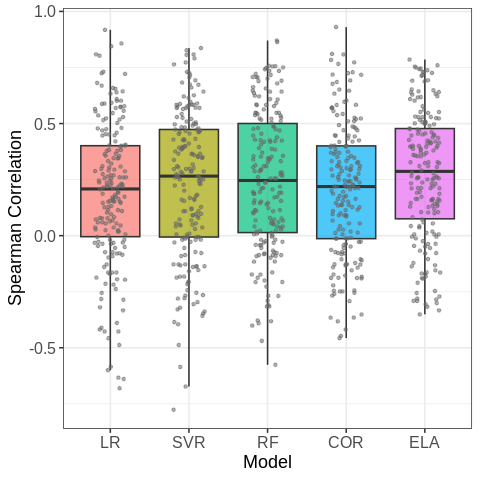

In [ ]:
%%R

## ------------------------------------------------------------
## 0. Build dataset list
## ------------------------------------------------------------

dir.create(out, showWarnings = FALSE, recursive = TRUE)

dataset_list <- list()

dataset_list[["main"]] <- prepare_dataset_from_parameters(
  params = c(0.010, 0.05, 0.95),
  analysis_id = "main"
)

if (is.null(names(sa.sensitivity_analysis))) {
  names(sa.sensitivity_analysis) <- paste0(
    "SA_",
    seq_along(sa.sensitivity_analysis)
  )
}

for (sa_id in names(sa.sensitivity_analysis)) {

  x <- sa.sensitivity_analysis[[sa_id]]

  if (
    !is.null(x$ocmat_filtered) &&
      !is.null(x$abmat_filtered) &&
      !is.null(x$enmat_fastscore_filtered)
  ) {

    dataset_list[[sa_id]] <- clean_dataset_for_cv(
      list(
        analysis_id = sa_id,
        parameters = if (!is.null(x$parameters)) x$parameters else NA,
        ocmat = x$ocmat_filtered,
        abmat = x$abmat_filtered,
        enmat = x$enmat_fastscore_filtered
      )
    )

  } else if (!is.null(x$parameters)) {

    dataset_list[[sa_id]] <- prepare_dataset_from_parameters(
      params = x$parameters,
      analysis_id = sa_id
    )
  }
}

## ------------------------------------------------------------
## 1. Run 10-fold CV once for each dataset
## ------------------------------------------------------------

model_cv_scores <- evaluate_all_parameter_sets_cv(
  dataset_list = dataset_list,
  K = 10,
  metric = "correlation",
  seed = 123,

  runsa_rep = 32,
  runsa_threads = 64,
  runsa_totalit = 9600,
  runsa_intv = 200,
  runsa_lambda = 3.8,
  runsa_we = 1e-5,

  show_progress = TRUE
)

saveRDS(
  model_cv_scores,
  file = file.path(out, "model_cv_all_parameter_sets_raw.rds")
)



            analysis_id Method n_samples n_taxa       Mean        SD
41                 main     LR       106     58 0.13014366 0.3738990
11 p0p005_prev0p10_0p90     LR       106     50 0.18757045 0.2098974
46 p0p005_prev0p07_0p93     LR       106     59 0.19691703 0.3249173
56 p0p005_prev0p05_0p95     LR       106     62 0.19154781 0.3543279
81 p0p005_prev0p03_0p97     LR       106     69 0.21248009 0.2244639
1  p0p008_prev0p10_0p90     LR       106     47 0.16802212 0.3315682
26 p0p008_prev0p07_0p93     LR       106     53 0.14002619 0.3604913
51 p0p008_prev0p05_0p95     LR       106     61 0.15210942 0.3613815
71 p0p008_prev0p03_0p97     LR       106     67 0.09601891 0.4521802
21 p0p010_prev0p07_0p93     LR       106     52 0.23808473 0.4149112
66 p0p010_prev0p03_0p97     LR       106     65 0.39194101 0.1763523
91 p0p010_prev0p01_0p99     LR       106     72 0.21599125 0.3329000
2  p0p012_prev0p07_0p93     LR       106     47 0.15610787 0.3707064
27 p0p012_prev0p05_0p95     LR    

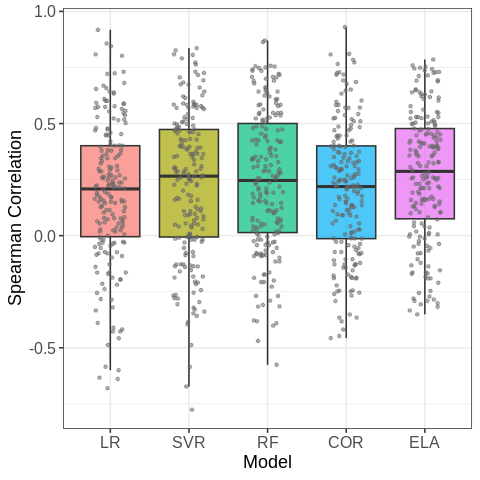

In [ ]:
%%R
## ------------------------------------------------------------
## 2. Summary table by dataset and method
## ------------------------------------------------------------

model_cv_summary_by_dataset <- summarize_model_cv_scores_by_dataset(
  model_cv_scores
)

model_cv_summary_by_dataset <- model_cv_summary_by_dataset[
  order(
    model_cv_summary_by_dataset$Method,
    model_cv_summary_by_dataset$analysis_id
  ),
]


print(model_cv_summary_by_dataset)

write.csv(
  model_cv_summary_by_dataset,
  file = file.path(out, "model_cv_summary_by_dataset.csv"),
  row.names = FALSE
)

## ------------------------------------------------------------
## 3. Pooled plot across all datasets
## ------------------------------------------------------------

p_pooled <- plot_model_cv_scores(
  model_cv_scores,
  metric = "correlation"
)

ggplot2::ggsave(
  file.path(out, "evaluate_models_cv_all_parameter_sets_pooled.png"),
  plot = p_pooled$plot,
  width = 6.5,
  height = 6.5,
  dpi = 600
)

print(p_pooled$plot)

## ------------------------------------------------------------
## 4. Faceted plot by dataset
## ------------------------------------------------------------
#
#p_by_dataset <- plot_model_cv_scores_by_dataset(
#  model_cv_scores,
#  metric = "correlation",
#  ncol = 4
#)
#
#ggplot2::ggsave(
#  file.path(out, "evaluate_models_cv_all_parameter_sets_by_dataset.png"),
#  plot = p_by_dataset$plot,
#  width = 14,
#  height = 14,
#  dpi = 600
#)
#
#print(p_by_dataset$plot)

In [ ]:
%%R
## ------------------------------------------------------------
## 2b. Pooled summary statistics by method
## ------------------------------------------------------------
## This table numerically summarizes the boxes in the pooled plot.

model_cv_scores_pooled <- model_cv_scores[
  is.finite(model_cv_scores$MetricValue),
  ,
  drop = FALSE
]

model_cv_box_summary_by_method <- aggregate(
  MetricValue ~ Method,
  data = model_cv_scores_pooled,
  FUN = function(x) {
    c(
      N = length(x),
      Mean = mean(x),
      SD = sd(x),
      Min = min(x),
      Q1 = as.numeric(quantile(x, 0.25)),
      Median = median(x),
      Q3 = as.numeric(quantile(x, 0.75)),
      Max = max(x)
    )
  }
)

model_cv_box_summary_by_method <- do.call(
  data.frame,
  model_cv_box_summary_by_method
)

colnames(model_cv_box_summary_by_method) <- c(
  "Method",
  "N",
  "Mean",
  "SD",
  "Min",
  "Q1",
  "Median",
  "Q3",
  "Max"
)

method_order <- c("LR", "SVR", "RF", "COR", "ELA")

model_cv_box_summary_by_method$Method <- factor(
  model_cv_box_summary_by_method$Method,
  levels = method_order
)

model_cv_box_summary_by_method <- model_cv_box_summary_by_method[
  order(model_cv_box_summary_by_method$Method),
]

model_cv_box_summary_by_method$Method <- as.character(
  model_cv_box_summary_by_method$Method
)

print(model_cv_box_summary_by_method)

  Method   N      Mean        SD        Min           Q1    Median        Q3
1     LR 190 0.1882105 0.3196287 -0.6803724 -0.004545455 0.2083679 0.4012177
2    SVR 190 0.2249367 0.3284200 -0.7762638 -0.006097674 0.2655574 0.4735358
3     RF 190 0.2434652 0.3115276 -0.5757576  0.013705932 0.2461115 0.5002894
4    COR 190 0.2034741 0.2939879 -0.4566258 -0.013299433 0.2190132 0.4003849
5    ELA 190 0.2692188 0.2855806 -0.3508107  0.075212691 0.2866953 0.4776755
        Max
1 0.9179374
2 0.8363636
3 0.8701617
4 0.9300955
5 0.7853963


## Diversity index

In [ ]:
%%R

library(vegan)

## ------------------------------------------------------------
## 1. Helper: summarize one dataset
## ------------------------------------------------------------

summarize_microbiome_base_one <- function(analysis_id,
                                          abmat,
                                          enmat_fastscore,
                                          distance = "bray",
                                          permutations = 999) {

  community_matrix <- as.data.frame(abmat, check.names = FALSE)
  env_vector <- as.numeric(enmat_fastscore[, 1])

  observed <- specnumber(community_matrix)
  simpson  <- diversity(community_matrix, index = "simpson")
  shannon  <- diversity(community_matrix, index = "shannon")
  pielou   <- ifelse(observed > 1, shannon / log(observed), NA)

  alpha_df <- data.frame(
    Observed = observed,
    Simpson = simpson,
    Shannon = shannon,
    Pielou = pielou,
    FAST_score = env_vector
  )

  ## Alpha diversity correlations
  alpha_corr <- do.call(
    rbind,
    lapply(c("Observed", "Simpson", "Shannon", "Pielou"), function(metric) {

      ct <- suppressWarnings(
        cor.test(
          alpha_df[[metric]],
          alpha_df$FAST_score,
          method = "spearman"
        )
      )

      data.frame(
        analysis_id = analysis_id,
        metric = metric,
        spearman_rho = unname(ct$estimate),
        p_value = ct$p.value,
        n_samples = nrow(community_matrix),
        n_taxa = ncol(community_matrix),
        stringsAsFactors = FALSE
      )
    })
  )

  ## PERMANOVA
  env_df <- data.frame(FAST_score = env_vector)
  dist_matrix <- vegdist(community_matrix, method = distance)

  adonis_res <- adonis2(
    dist_matrix ~ FAST_score,
    data = env_df,
    permutations = permutations
  )

  permanova <- data.frame(
    analysis_id = analysis_id,
    permanova_R2 = adonis_res$R2[1],
    permanova_p = adonis_res$`Pr(>F)`[1],
    F_value = adonis_res$F[1],
    n_samples = nrow(community_matrix),
    n_taxa = ncol(community_matrix),
    distance = distance,
    permutations = permutations,
    stringsAsFactors = FALSE
  )

  list(
    alpha_corr = alpha_corr,
    permanova = permanova
  )
}

## ------------------------------------------------------------
## 2. Main + sensitivity-analysis datasets
## ------------------------------------------------------------

alpha_corr_list <- list()
permanova_list <- list()

## Main
main_dat <- prepare_dataset_from_parameters(
  params = c(0.010, 0.05, 0.95),
  analysis_id = "main"
)

res_main <- summarize_microbiome_base_one(
  analysis_id = "main",
  abmat = main_dat$abmat,
  enmat_fastscore = main_dat$enmat,
  distance = "bray",
  permutations = 2999
)

alpha_corr_list[["main"]] <- res_main$alpha_corr
permanova_list[["main"]] <- res_main$permanova

## Sensitivity analyses
if (is.null(names(sa.sensitivity_analysis))) {
  names(sa.sensitivity_analysis) <- paste0("SA_", seq_along(sa.sensitivity_analysis))
}

for (sa_id in names(sa.sensitivity_analysis)) {

  x <- sa.sensitivity_analysis[[sa_id]]

  if (!is.null(x$abmat_filtered) &&
      !is.null(x$enmat_fastscore_filtered)) {

    res_i <- summarize_microbiome_base_one(
      analysis_id = sa_id,
      abmat = x$abmat_filtered,
      enmat_fastscore = x$enmat_fastscore_filtered,
      distance = "bray",
      permutations = 2999
    )

  } else if (!is.null(x$parameters)) {

    dat_i <- prepare_dataset_from_parameters(
      params = x$parameters,
      analysis_id = sa_id
    )

    res_i <- summarize_microbiome_base_one(
      analysis_id = sa_id,
      abmat = dat_i$abmat,
      enmat_fastscore = dat_i$enmat,
      distance = "bray",
      permutations = 2999
    )

  } else {
    next
  }

  alpha_corr_list[[sa_id]] <- res_i$alpha_corr
  permanova_list[[sa_id]] <- res_i$permanova
}

## ------------------------------------------------------------
## 3. Combine and sort
## ------------------------------------------------------------

microbiome_alpha_correlation_summary <- do.call(rbind, alpha_corr_list)

microbiome_alpha_correlation_summary$metric <- factor(
  microbiome_alpha_correlation_summary$metric,
  levels = c("Observed", "Simpson", "Shannon", "Pielou")
)

microbiome_alpha_correlation_summary <- microbiome_alpha_correlation_summary[
  order(
    microbiome_alpha_correlation_summary$metric,
    microbiome_alpha_correlation_summary$analysis_id
  ),
]

rownames(microbiome_alpha_correlation_summary) <- NULL

microbiome_permanova_summary <- do.call(rbind, permanova_list)

microbiome_permanova_summary <- microbiome_permanova_summary[
  order(microbiome_permanova_summary$analysis_id),
]

rownames(microbiome_permanova_summary) <- NULL

print(microbiome_alpha_correlation_summary)
print(microbiome_permanova_summary)

## ------------------------------------------------------------
## 4. Save two CSV files
## ------------------------------------------------------------

write.csv(
  microbiome_alpha_correlation_summary,
  file = file.path(out, "microbiome_alpha_correlation_main_and_sensitivity.csv"),
  row.names = FALSE
)

write.csv(
  microbiome_permanova_summary,
  file = file.path(out, "microbiome_permanova_main_and_sensitivity.csv"),
  row.names = FALSE
)

            analysis_id   metric spearman_rho    p_value n_samples n_taxa
1                  main Observed  0.135058847 0.16747515       106     58
2  p0p005_prev0p03_0p97 Observed  0.084102039 0.39136935       106     69
3  p0p005_prev0p05_0p95 Observed  0.093526027 0.34029404       106     62
4  p0p005_prev0p07_0p93 Observed  0.098307369 0.31607008       106     59
5  p0p005_prev0p10_0p90 Observed  0.146933748 0.13283672       106     50
6  p0p008_prev0p03_0p97 Observed  0.087502650 0.37243288       106     67
7  p0p008_prev0p05_0p95 Observed  0.117384644 0.23077409       106     61
8  p0p008_prev0p07_0p93 Observed  0.153512924 0.11615937       106     53
9  p0p008_prev0p10_0p90 Observed  0.171056383 0.07956807       106     47
10 p0p010_prev0p01_0p99 Observed  0.084974749 0.38645551       106     72
11 p0p010_prev0p03_0p97 Observed  0.085876327 0.38141830       106     65
12 p0p010_prev0p07_0p93 Observed  0.144363446 0.13982705       106     52
13 p0p012_prev0p01_0p99 Observed  0.08